In [1]:
import pandas as pd #the csv reading library
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns
from scipy.optimize import curve_fit
from scipy.integrate import trapz


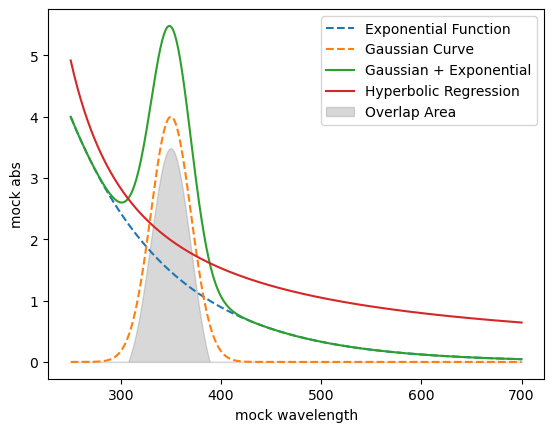

Area between y_added and y_regression: 150.59153744338852


,multiplyer,area,norm_val,area_normalized
0,4,150.591537,0.515366,292.203034


In [2]:
# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the hyperbolic regression function
def hyperbolic_regression(x, a, b):
    return a / (x + b)

# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 1
b_exp = -0.01  # Adjusted to make the value 1 at x = 250

# Set parameters for the Gaussian function
mean_gaussian = 350
std_gaussian = 20

def scale_experiment(multiplyer, exp_scale, gaus_scale): 
    
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp*multiplyer*exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplyer*gaus_scale) 

    y_added = y_exp + y_gaussian 
    # hyperbolic regression
    popt, pcov = curve_fit(hyperbolic_regression, x_values, y_added)
    y_regression = hyperbolic_regression(x_values, *popt)

    #calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[250]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Hyperbolic Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    dict = {'multiplyer':[multiplyer],
            'area':[area],
            'norm_val':[norm_val],
            'area_normalized': [area_n]}
    sums = pd.DataFrame(dict)
    Frames.append(sums)
    
Frames = []

scale_experiment(4, 1, 1)

sums = pd.concat(Frames, axis=0, ignore_index=False)

sums

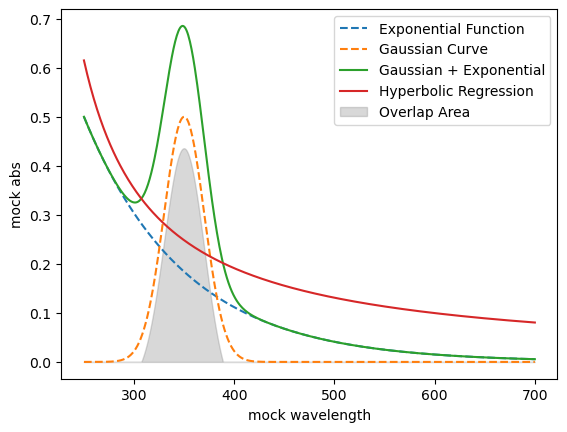

Area between y_added and y_regression: 18.824434183643326


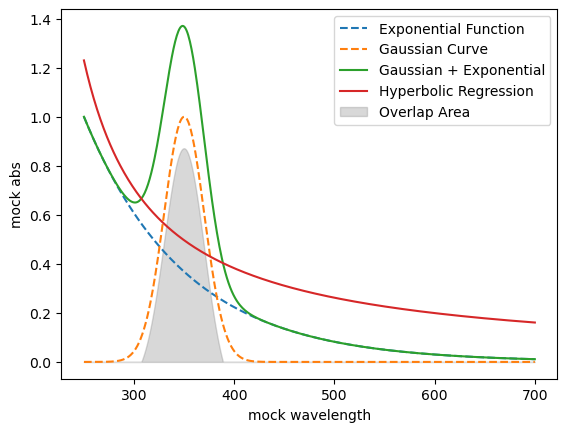

Area between y_added and y_regression: 37.64910930641908


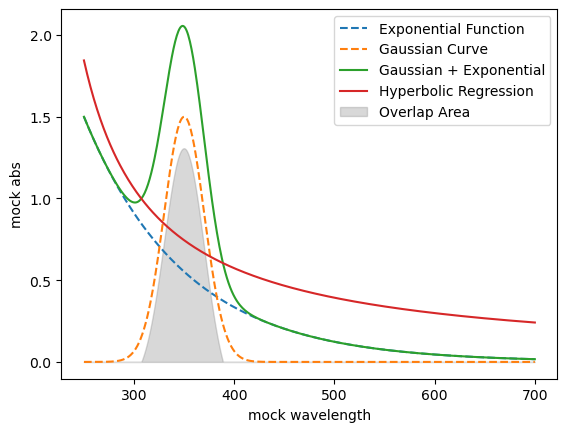

Area between y_added and y_regression: 56.47211924425453


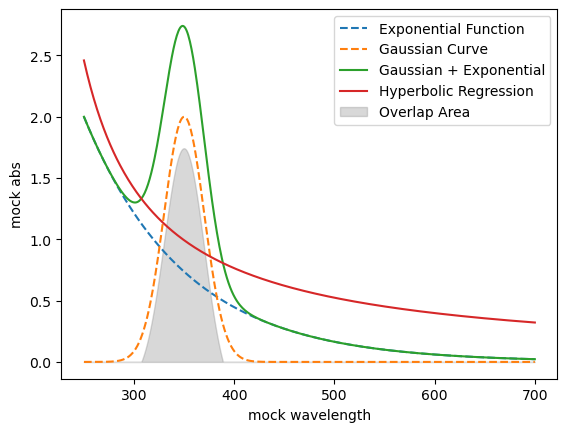

Area between y_added and y_regression: 75.29581092893268


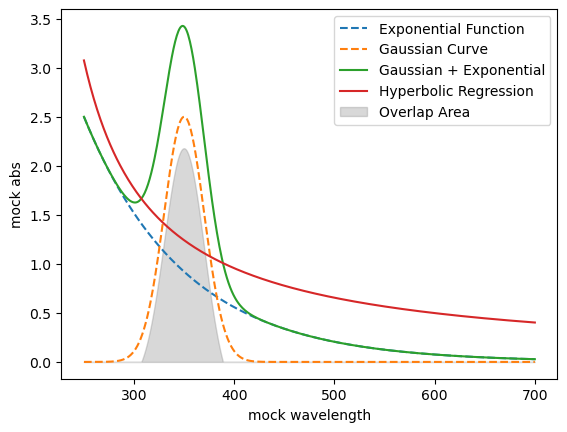

Area between y_added and y_regression: 94.12026393510652


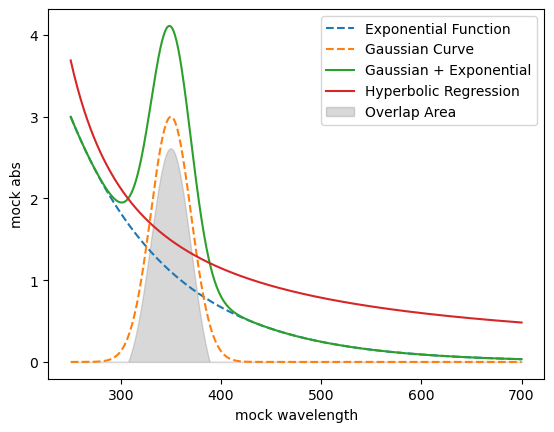

Area between y_added and y_regression: 112.94386644989049


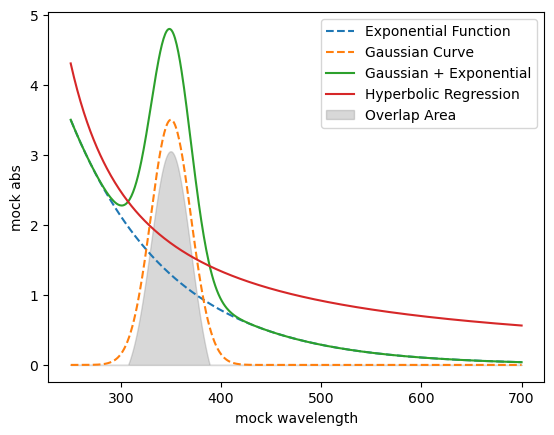

Area between y_added and y_regression: 131.7710276637493


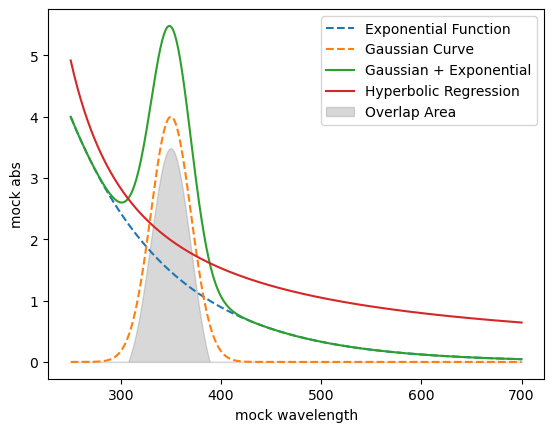

Area between y_added and y_regression: 150.59153744338852


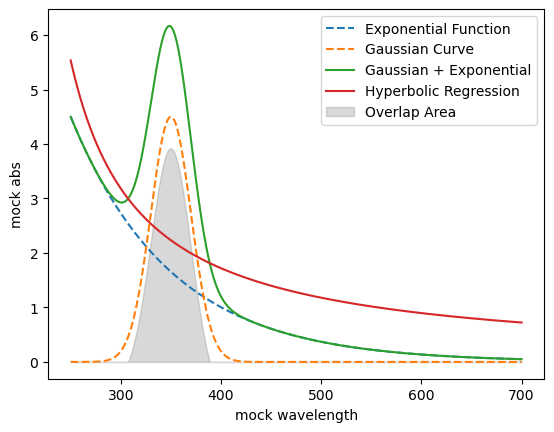

Area between y_added and y_regression: 169.41590989928943


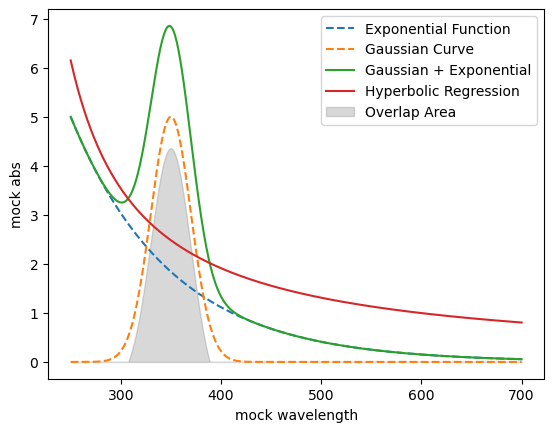

Area between y_added and y_regression: 188.244676487241


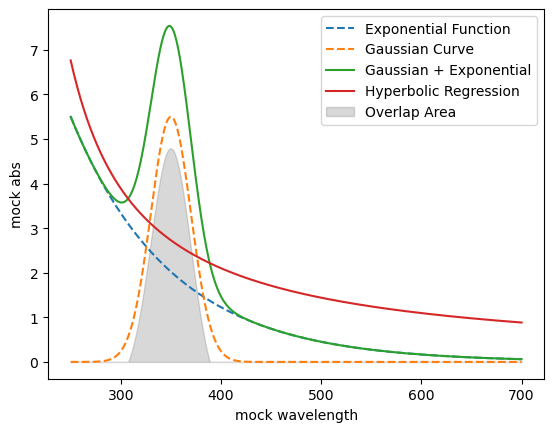

Area between y_added and y_regression: 207.0644087926817


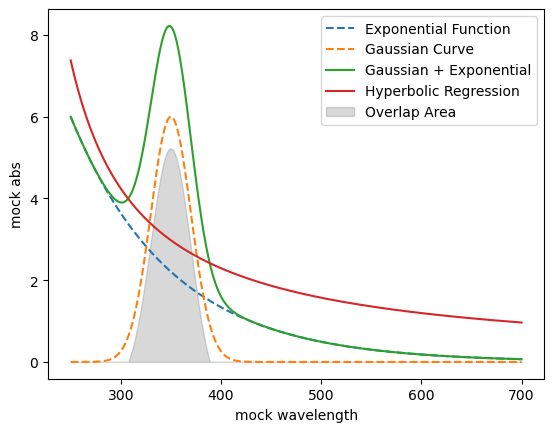

Area between y_added and y_regression: 225.89322790097597


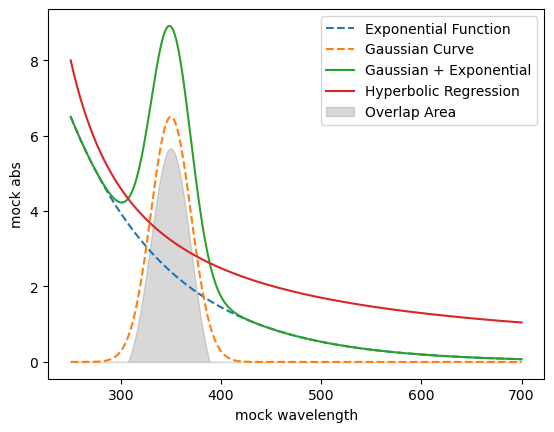

Area between y_added and y_regression: 244.71119075345428


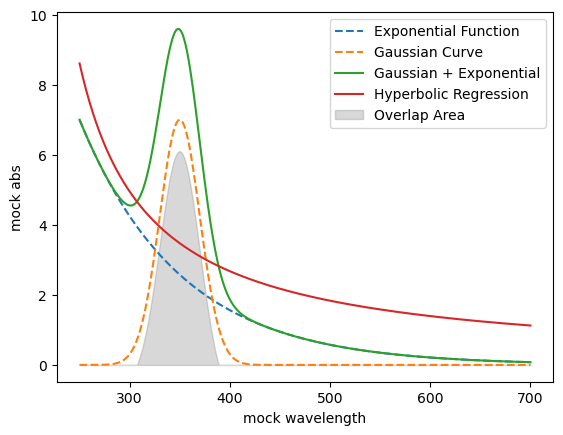

Area between y_added and y_regression: 263.5360129742328


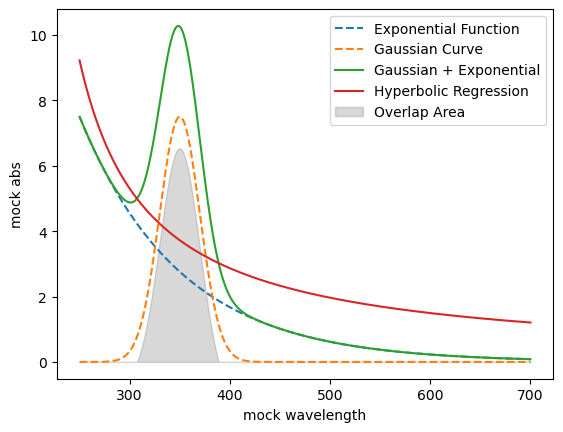

Area between y_added and y_regression: 282.36790964441855


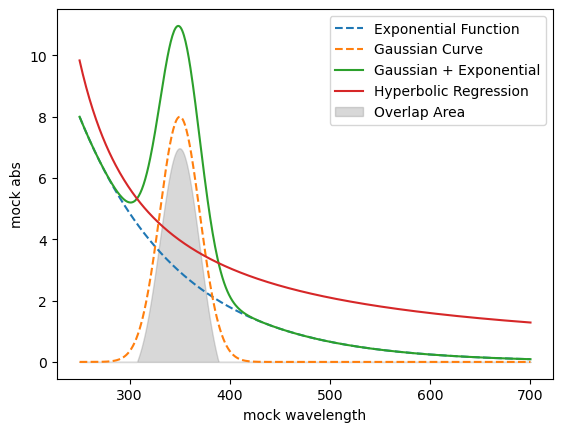

Area between y_added and y_regression: 301.18397660831806


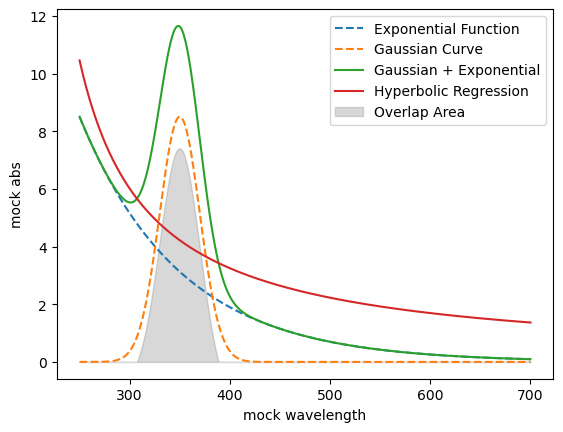

Area between y_added and y_regression: 320.00884635846165


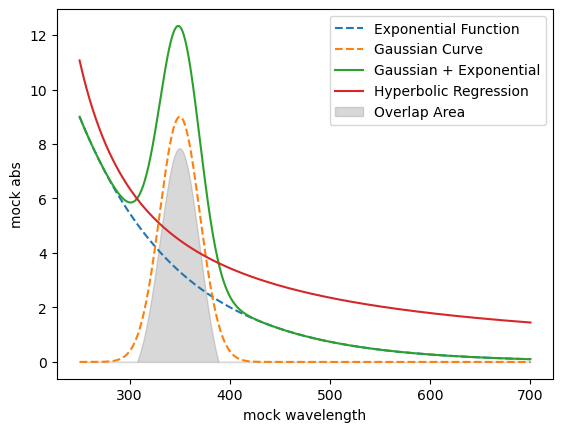

Area between y_added and y_regression: 338.83200980678816


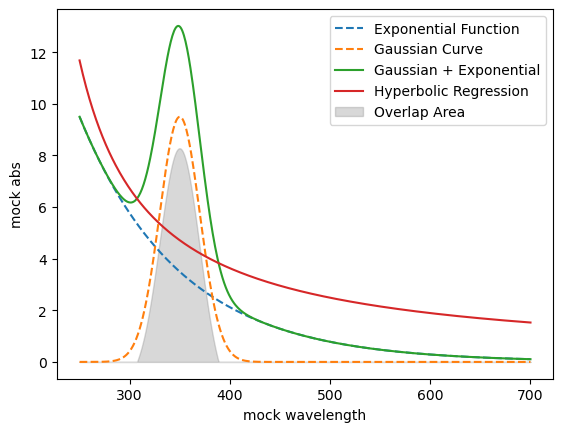

Area between y_added and y_regression: 357.6561345478925


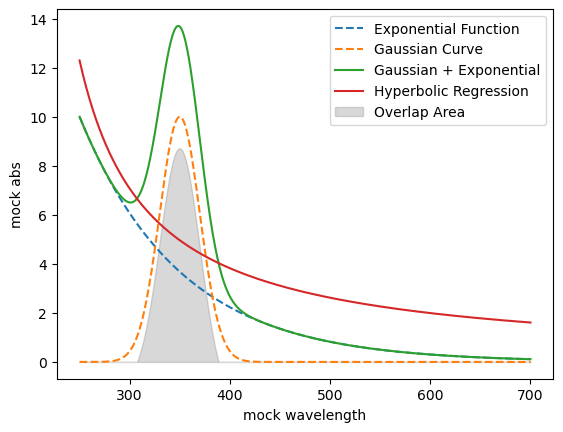

Area between y_added and y_regression: 376.47895416290686


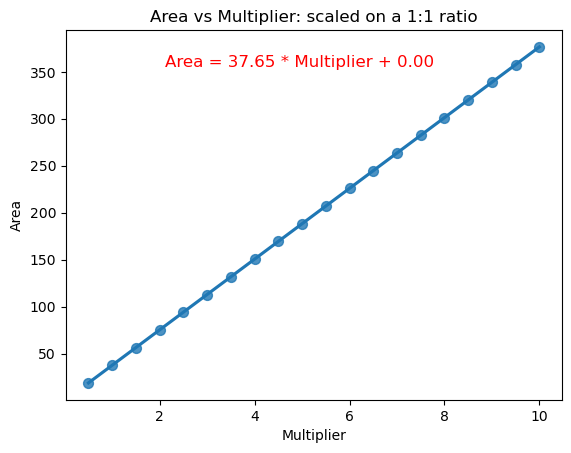

In [3]:
Frames = []

multiplier_values = np.arange(.5, 10.5, 0.5)


for multiplier in multiplier_values:
    scale_experiment(multiplier, 1, 1)

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: scaled on a 1:1 ratio')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()


In [4]:
df

,multiplyer,area,norm_val,area_normalized
0,0.5,18.824434,0.064421,292.210671
0,1.0,37.649109,0.128842,292.212541
0,1.5,56.472119,0.193262,292.204548
0,2.0,75.295811,0.257683,292.203198
0,2.5,94.120264,0.322104,292.204751
0,3.0,112.943866,0.386525,292.203586
0,3.5,131.771028,0.450945,292.210645
0,4.0,150.591537,0.515366,292.203034
0,4.5,169.415910,0.579787,292.203776
0,5.0,188.244676,0.644208,292.211191


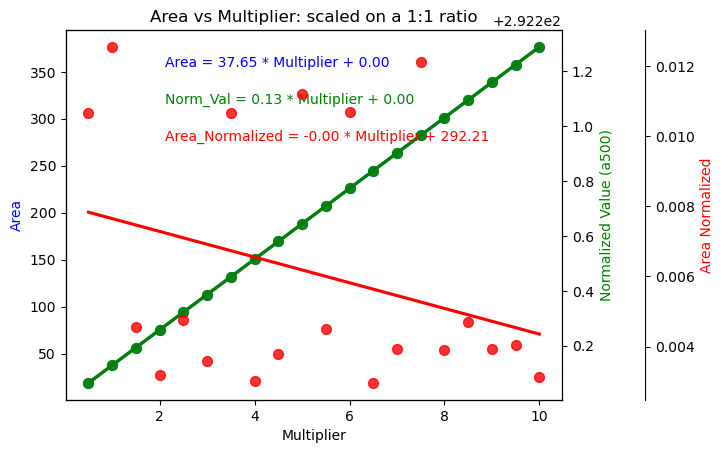

In [5]:
# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplyer', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a500)', color='green')

# Create a third y-axis for 'area_normalized'
ax3 = ax1.twinx()
sns.regplot(x='multiplyer', y='area_normalized', data=df, ci=None, scatter_kws={'s': 50}, ax=ax3, color='red', label='Area Normalized')
ax3.spines['right'].set_position(('outward', 60))
ax3.set_ylabel('Area Normalized', color='red')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplyer'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

# Get regression coefficients for 'area_normalized'
coefficients_area_normalized = np.polyfit(df['multiplyer'], df['area_normalized'], 1)

# Plot the equation of the line for 'area_normalized'
equation_area_normalized = f'Area_Normalized = {coefficients_area_normalized[0]:.2f} * Multiplier + {coefficients_area_normalized[1]:.2f}'
ax3.annotate(equation_area_normalized, xy=(0.2, 0.7), xycoords='axes fraction', fontsize=10, color='red')

plt.title('Area vs Multiplier: scaled on a 1:1 ratio')
plt.show()

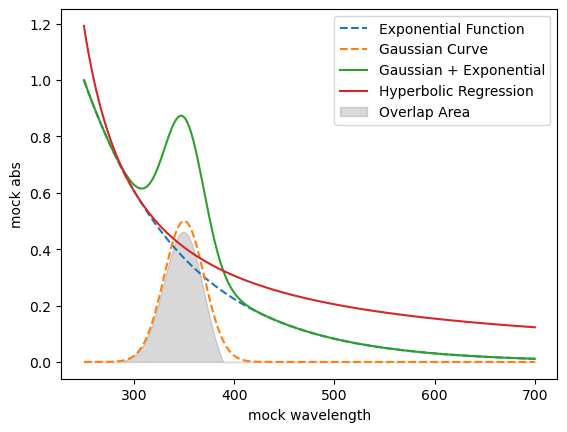

Area between y_added and y_regression: 21.36767686505056


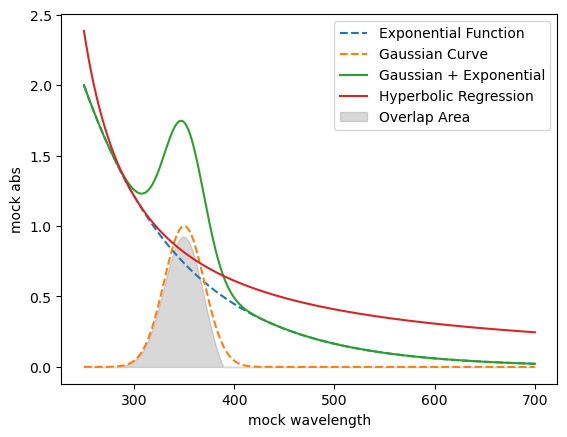

Area between y_added and y_regression: 42.735279800185374


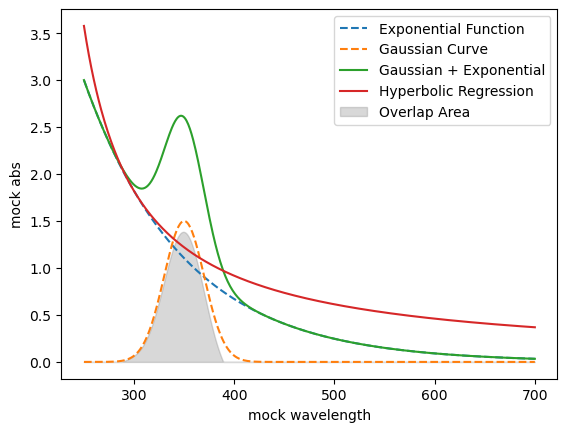

Area between y_added and y_regression: 64.10280234554833


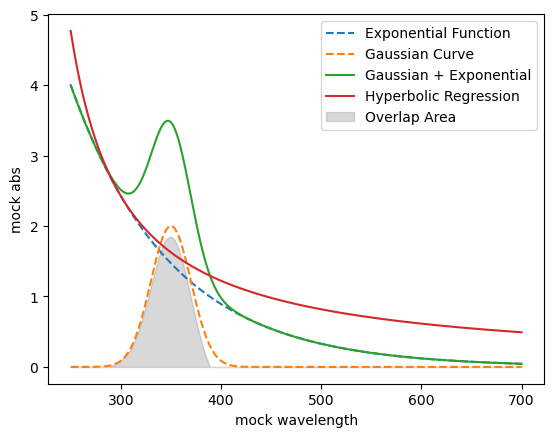

Area between y_added and y_regression: 85.47038755487985


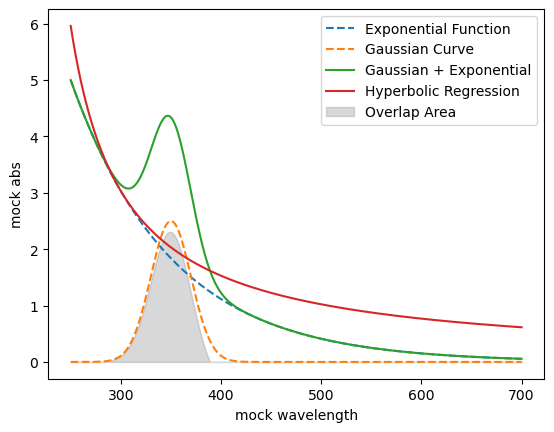

Area between y_added and y_regression: 106.8382887602194


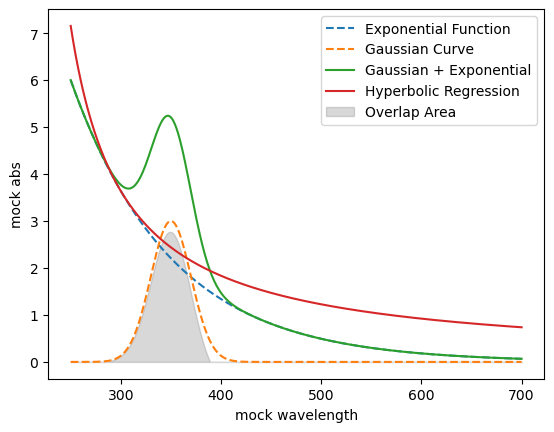

Area between y_added and y_regression: 128.20851742378295


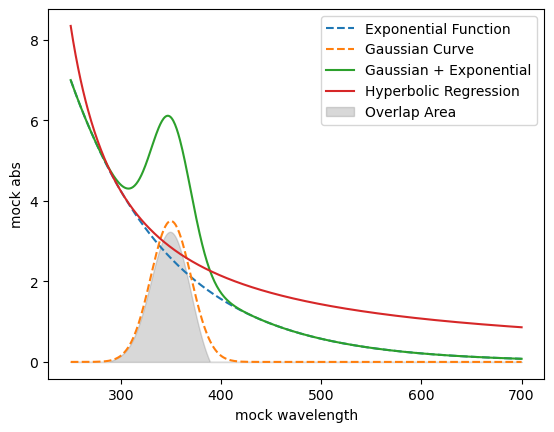

Area between y_added and y_regression: 149.57312412323694


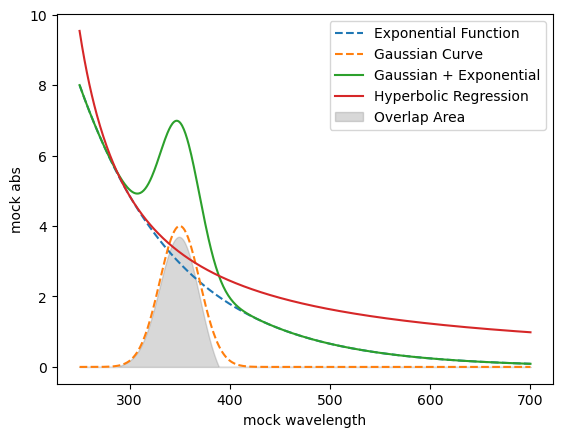

Area between y_added and y_regression: 170.9416383484379


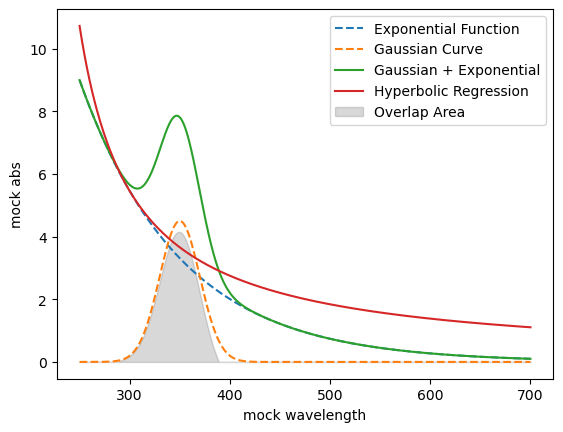

Area between y_added and y_regression: 192.3076040057769


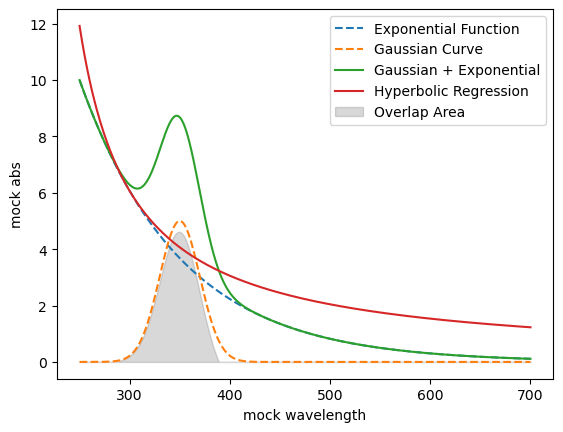

Area between y_added and y_regression: 213.68056767851928


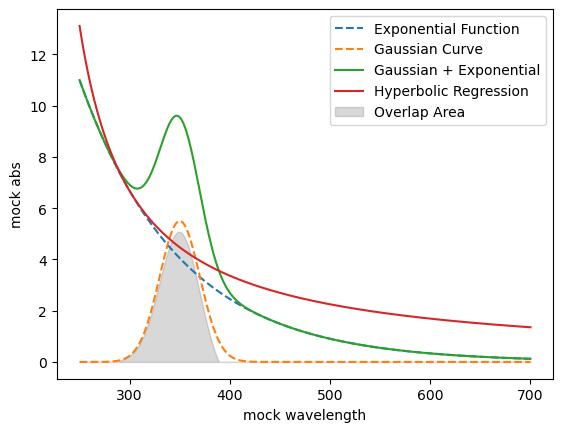

Area between y_added and y_regression: 235.04428210189045


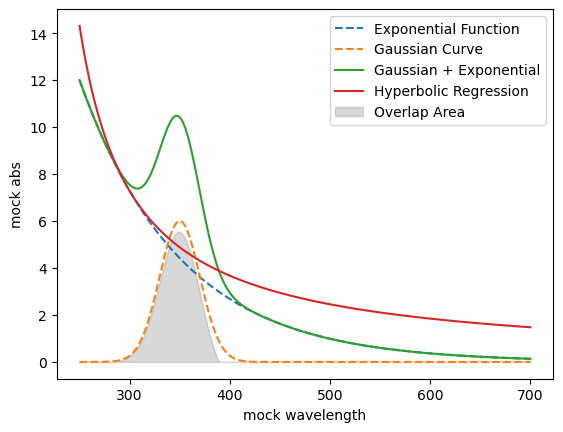

Area between y_added and y_regression: 256.41159134630215


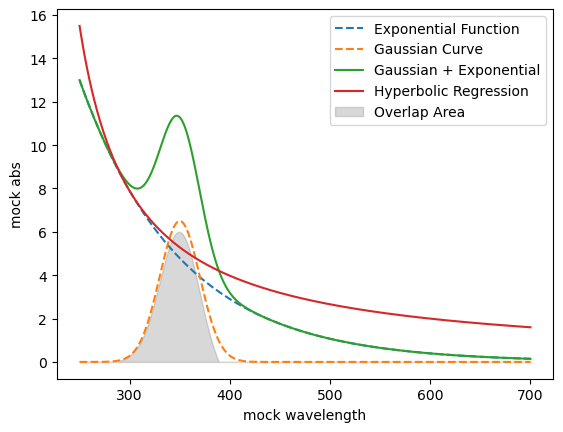

Area between y_added and y_regression: 277.7786291023811


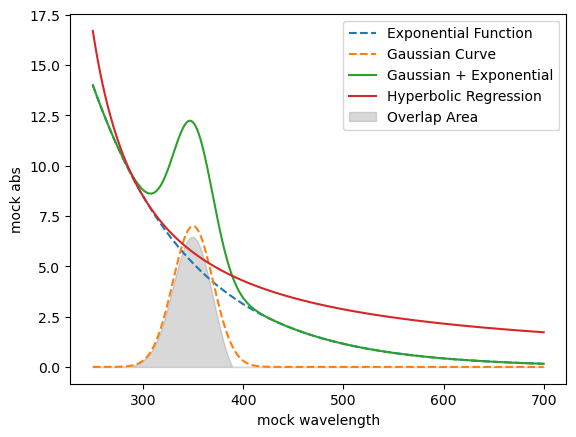

Area between y_added and y_regression: 299.1462805494708


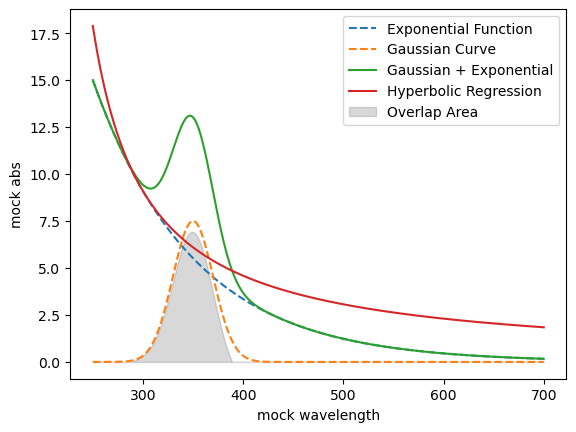

Area between y_added and y_regression: 320.5212338958414


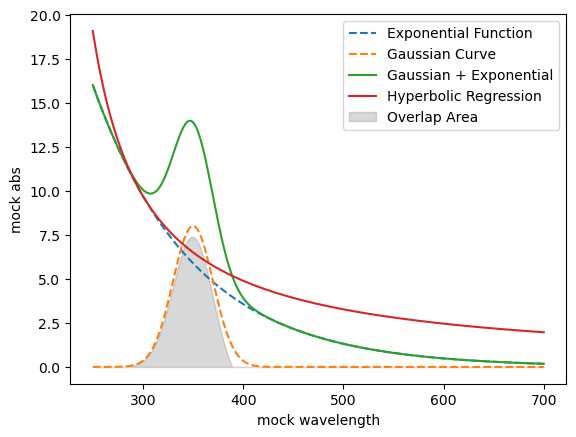

Area between y_added and y_regression: 341.8898449828646


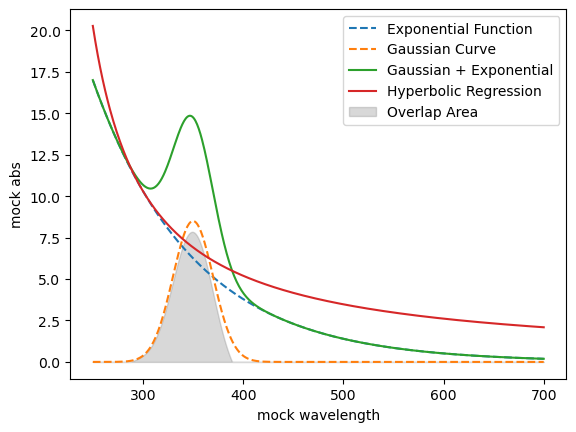

Area between y_added and y_regression: 363.2474244475681


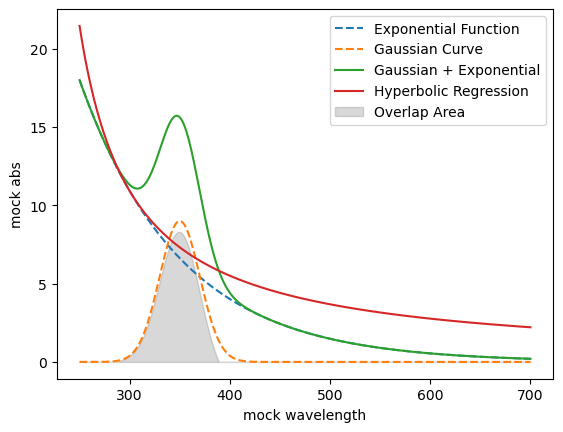

Area between y_added and y_regression: 384.62619467030765


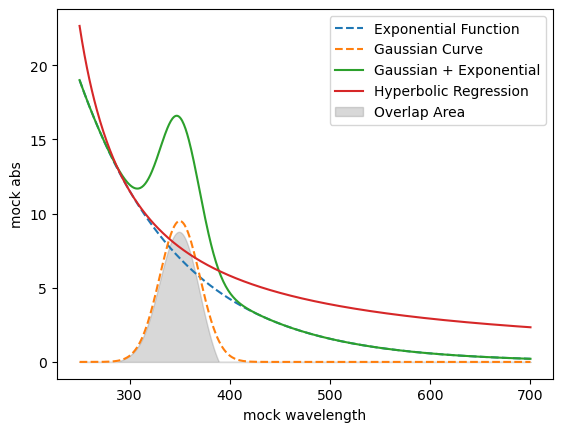

Area between y_added and y_regression: 405.9937769453168


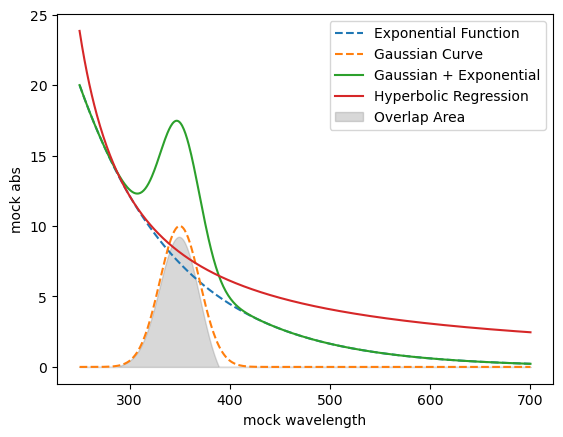

Area between y_added and y_regression: 427.35215590310065


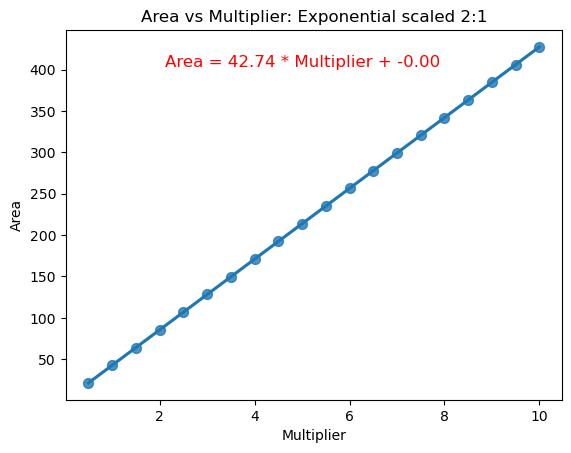

In [6]:
Frames = []

multiplier_values = np.arange(.5, 10.5, 0.5)


for multiplier in multiplier_values:
    scale_experiment(multiplier, 2,1)

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Exponential scaled 2:1')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

In [7]:
df

,multiplyer,area,norm_val,area_normalized
0,0.5,21.367677,0.128841,165.845325
0,1.0,42.735280,0.257682,165.845038
0,1.5,64.102802,0.386523,165.844735
0,2.0,85.470388,0.515364,165.844704
0,2.5,106.838289,0.644205,165.845177
0,3.0,128.208517,0.773046,165.848503
0,3.5,149.573124,0.901887,165.844644
0,4.0,170.941638,1.030728,165.845542
0,4.5,192.307604,1.159569,165.844042
0,5.0,213.680568,1.288410,165.848274


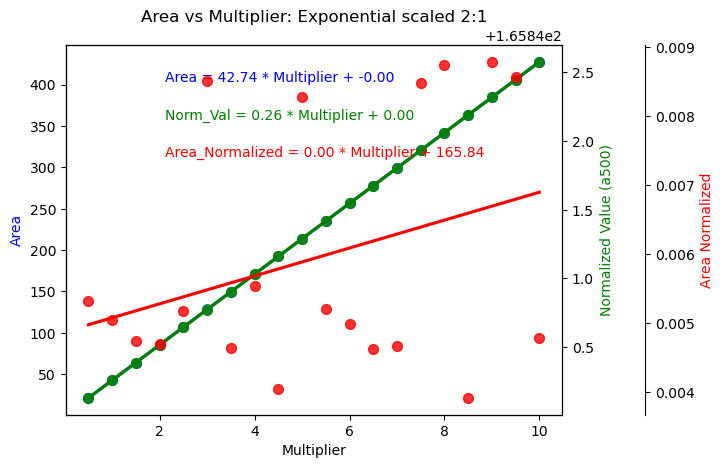

In [8]:
# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplyer', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a500)', color='green')

# Create a third y-axis for 'area_normalized'
ax3 = ax1.twinx()
sns.regplot(x='multiplyer', y='area_normalized', data=df, ci=None, scatter_kws={'s': 50}, ax=ax3, color='red', label='Area Normalized')
ax3.spines['right'].set_position(('outward', 60))
ax3.set_ylabel('Area Normalized', color='red')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplyer'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

# Get regression coefficients for 'area_normalized'
coefficients_area_normalized = np.polyfit(df['multiplyer'], df['area_normalized'], 1)

# Plot the equation of the line for 'area_normalized'
equation_area_normalized = f'Area_Normalized = {coefficients_area_normalized[0]:.2f} * Multiplier + {coefficients_area_normalized[1]:.2f}'
ax3.annotate(equation_area_normalized, xy=(0.2, 0.7), xycoords='axes fraction', fontsize=10, color='red')

plt.title('Area vs Multiplier: Exponential scaled 2:1')
plt.show()

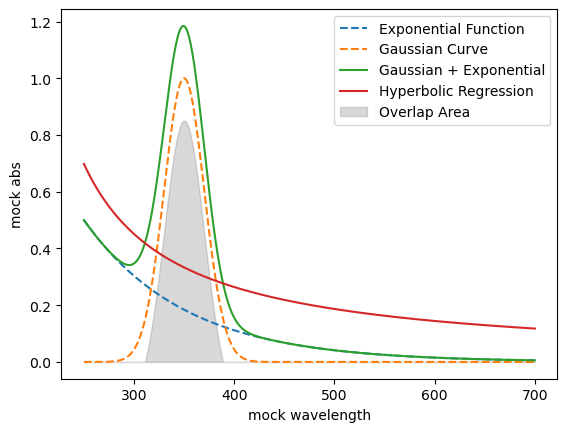

Area between y_added and y_regression: 35.93719817745756


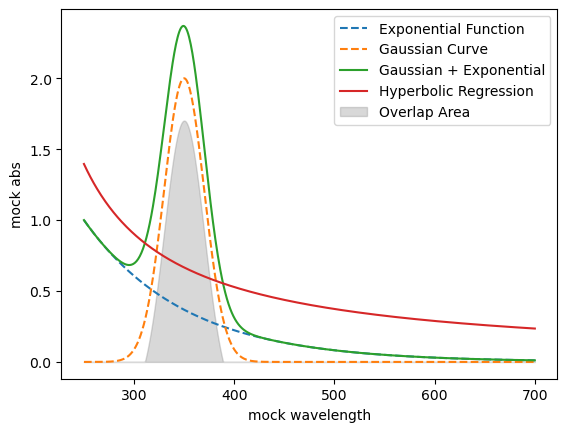

Area between y_added and y_regression: 71.87272610926158


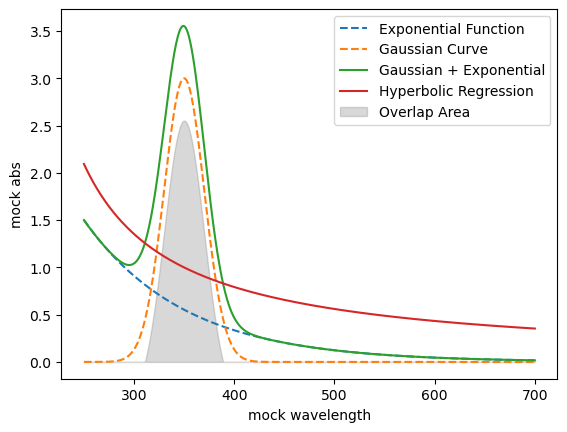

Area between y_added and y_regression: 107.80882689421793


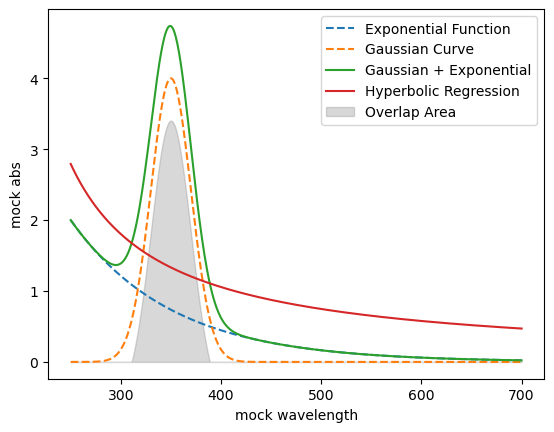

Area between y_added and y_regression: 143.74798002687533


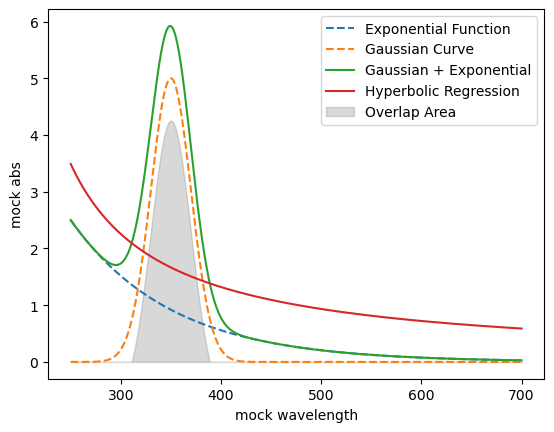

Area between y_added and y_regression: 179.68561557753625


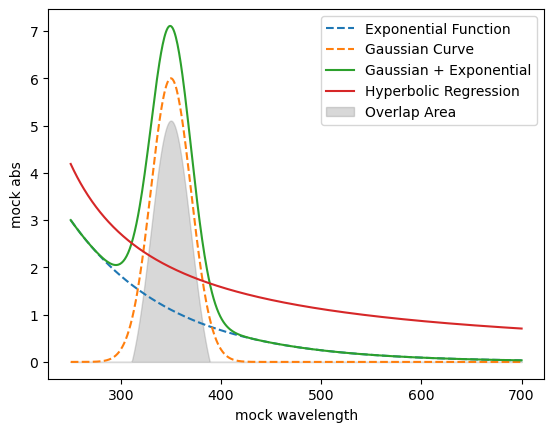

Area between y_added and y_regression: 215.62030943796705


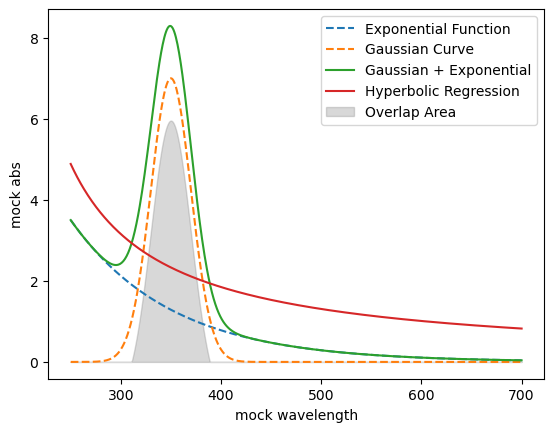

Area between y_added and y_regression: 251.5588378826386


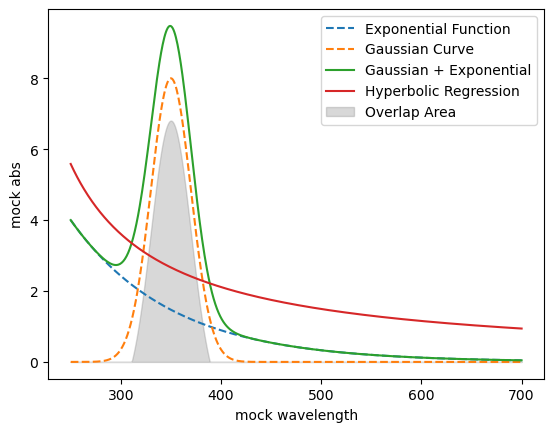

Area between y_added and y_regression: 287.49248101722685


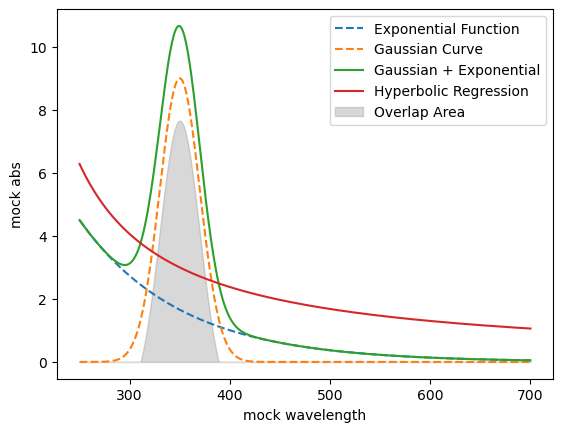

Area between y_added and y_regression: 323.4274732373518


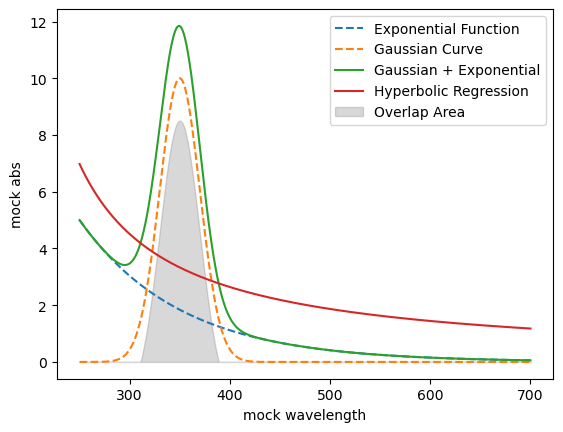

Area between y_added and y_regression: 359.3643159064929


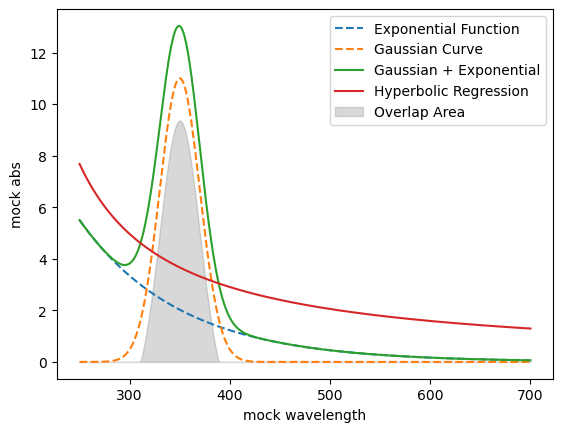

Area between y_added and y_regression: 395.3020984622772


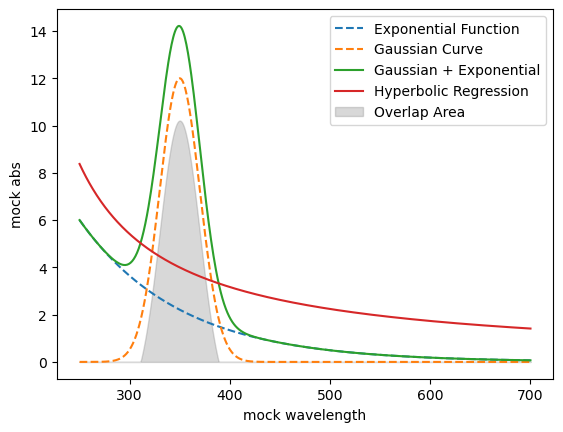

Area between y_added and y_regression: 431.2415869208691


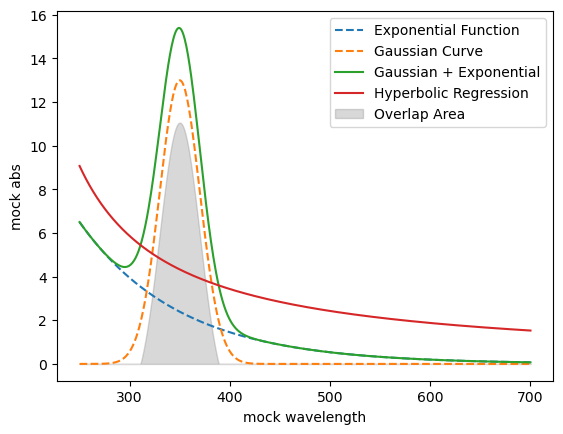

Area between y_added and y_regression: 467.17426199093995


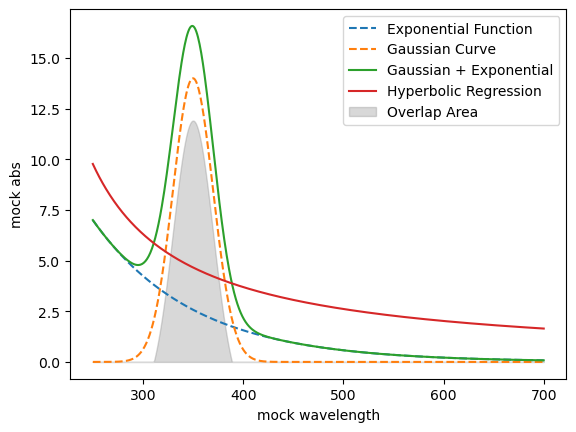

Area between y_added and y_regression: 503.1176656234588


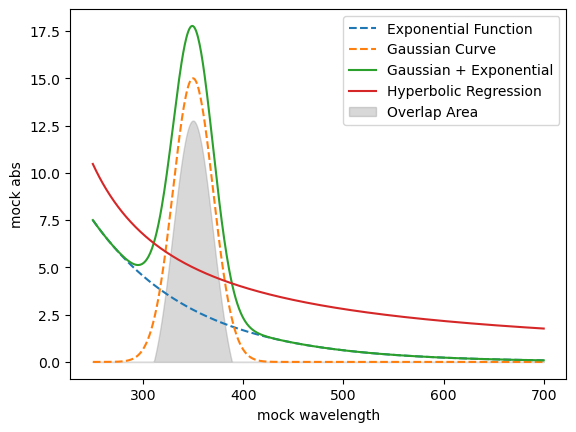

Area between y_added and y_regression: 539.0518905633277


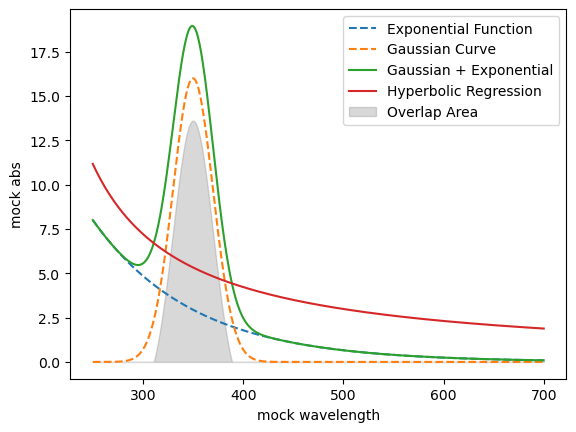

Area between y_added and y_regression: 574.988410690182


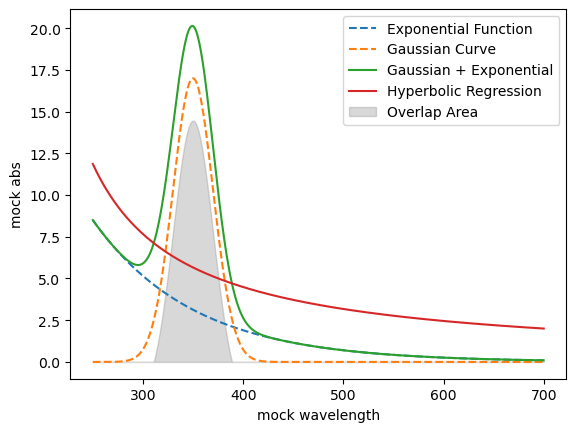

Area between y_added and y_regression: 610.9181374837526


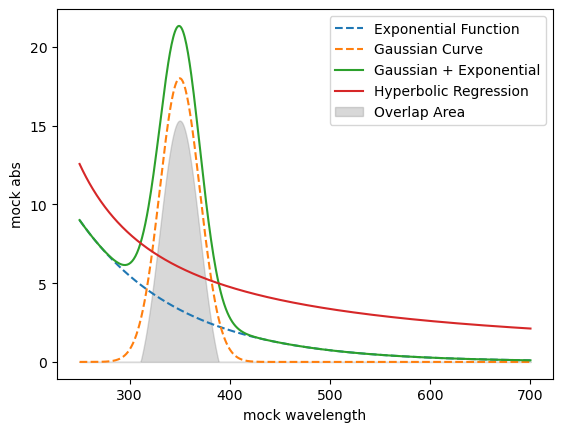

Area between y_added and y_regression: 646.8532337996508


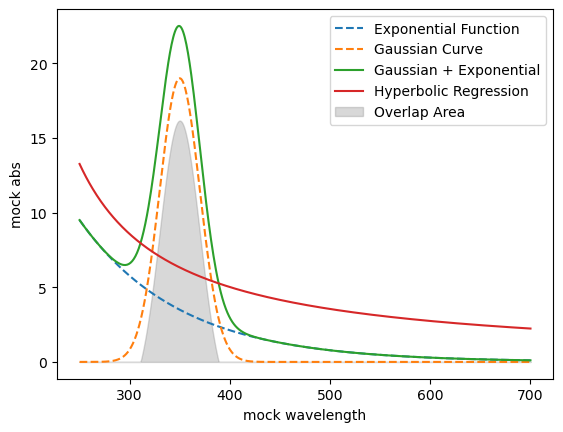

Area between y_added and y_regression: 682.8004300487744


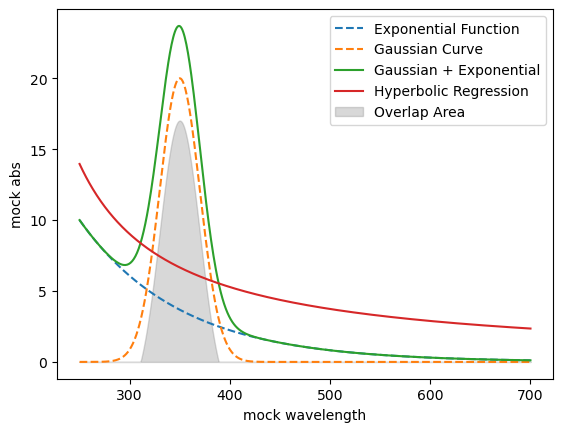

Area between y_added and y_regression: 718.733192464424


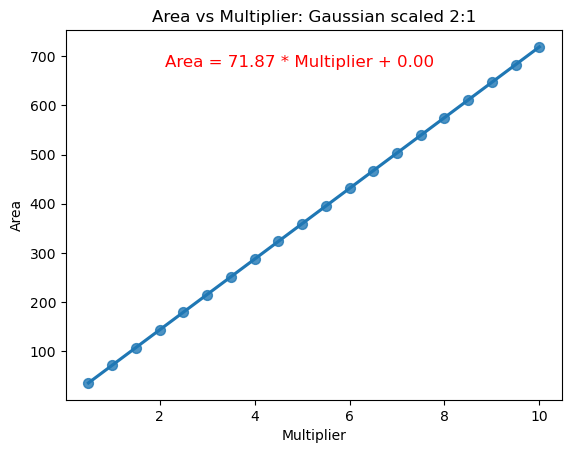

In [9]:
Frames = []

multiplier_values = np.arange(.5, 10.5, 0.5)


for multiplier in multiplier_values:
    scale_experiment(multiplier,1 ,2)

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian scaled 2:1')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

In [10]:
df

,multiplyer,area,norm_val,area_normalized
0,0.5,35.937198,0.064421,557.846601
0,1.0,71.872726,0.128843,557.833637
0,1.5,107.808827,0.193264,557.832280
0,2.0,143.747980,0.257685,557.843447
0,2.5,179.685616,0.322106,557.845435
0,3.0,215.620309,0.386528,557.839151
0,3.5,251.558838,0.450949,557.843165
0,4.0,287.492481,0.515370,557.836696
0,4.5,323.427473,0.579792,557.833992
0,5.0,359.364316,0.644213,557.834701


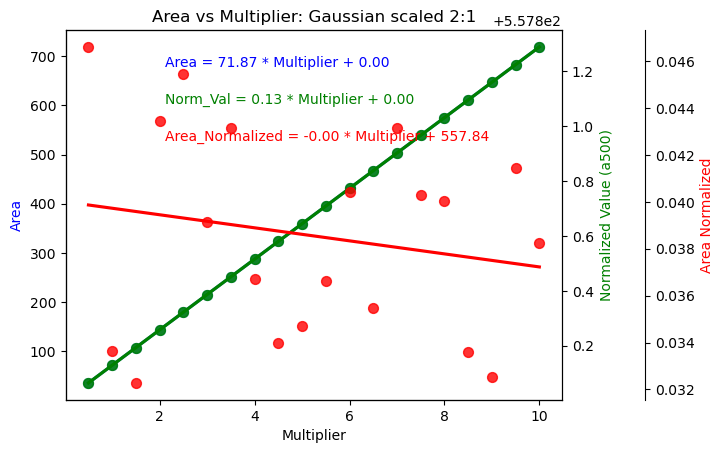

In [11]:
# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplyer', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a500)', color='green')

# Create a third y-axis for 'area_normalized'
ax3 = ax1.twinx()
sns.regplot(x='multiplyer', y='area_normalized', data=df, ci=None, scatter_kws={'s': 50}, ax=ax3, color='red', label='Area Normalized')
ax3.spines['right'].set_position(('outward', 60))
ax3.set_ylabel('Area Normalized', color='red')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplyer'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

# Get regression coefficients for 'area_normalized'
coefficients_area_normalized = np.polyfit(df['multiplyer'], df['area_normalized'], 1)

# Plot the equation of the line for 'area_normalized'
equation_area_normalized = f'Area_Normalized = {coefficients_area_normalized[0]:.2f} * Multiplier + {coefficients_area_normalized[1]:.2f}'
ax3.annotate(equation_area_normalized, xy=(0.2, 0.7), xycoords='axes fraction', fontsize=10, color='red')

plt.title('Area vs Multiplier: Gaussian scaled 2:1')
plt.show()

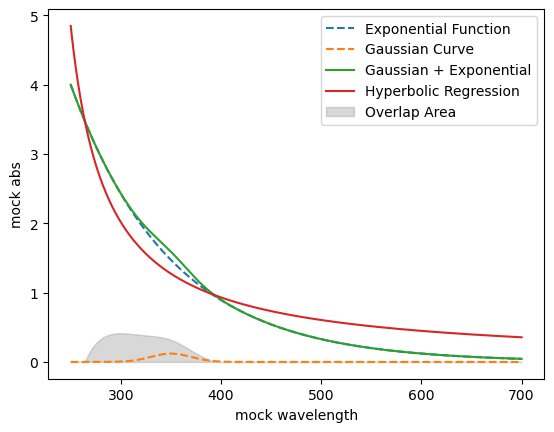

Area between y_added and y_regression: 36.709814936040566


,multiplyer,area,norm_val,area_normalized
0,4,36.709815,1.842223,19.926907


In [12]:
# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the hyperbolic regression function
def hyperbolic_regression(x, a, b):
    return a / (x + b)

# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 1
b_exp = -0.01  # Adjusted to make the value 1 at x = 250

# Set parameters for the Gaussian function
mean_gaussian = 350
std_gaussian = 20

def scale_experiment(multiplyer, exp_scale, gaus_scale): 
    
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp*multiplyer*exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplyer*gaus_scale) 

    y_added = y_exp + y_gaussian 
    # hyperbolic regression
    popt, pcov = curve_fit(hyperbolic_regression, x_values, y_added)
    y_regression = hyperbolic_regression(x_values, *popt)

    #calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[100]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Hyperbolic Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    dict = {'multiplyer':[multiplyer],
            'area':[area],
            'norm_val':[norm_val],
            'area_normalized': [area_n]}
    sums = pd.DataFrame(dict)
    Frames.append(sums)
    
Frames = []

scale_experiment(4, 1, .03)

sums = pd.concat(Frames, axis=0, ignore_index=False)

sums

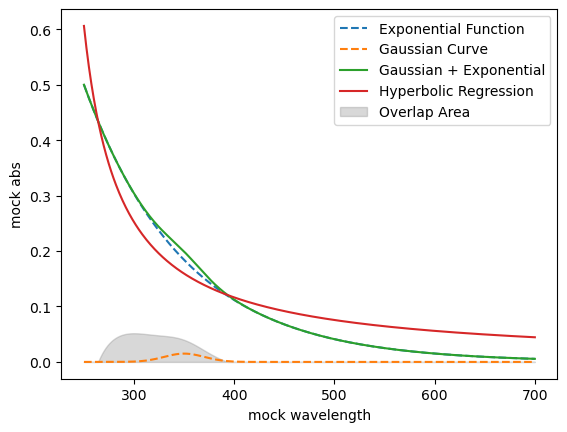

Area between y_added and y_regression: 4.588731745599095


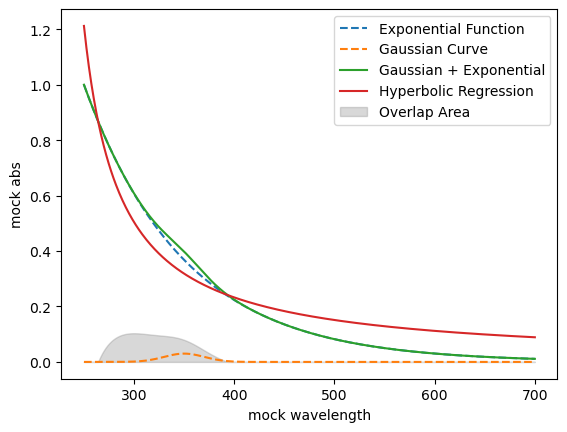

Area between y_added and y_regression: 9.177492040442866


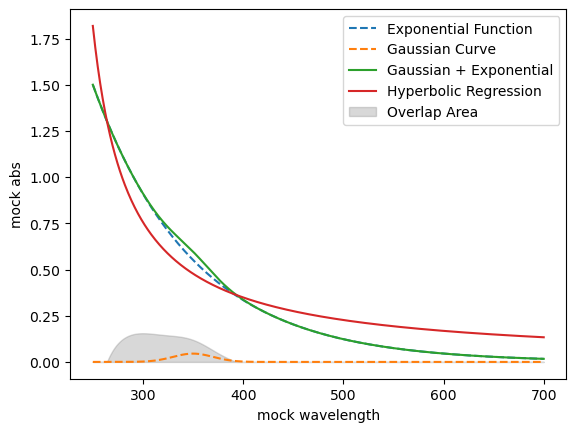

Area between y_added and y_regression: 13.766213579856808


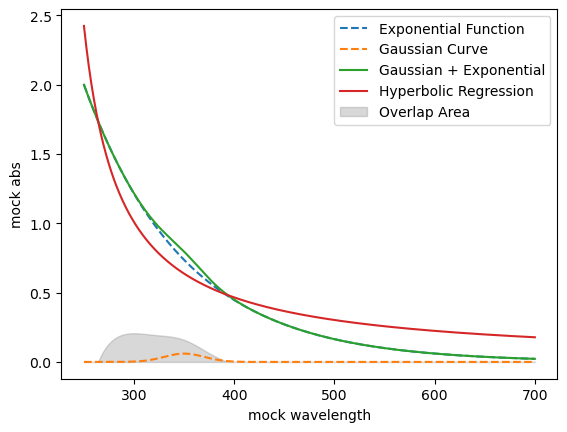

Area between y_added and y_regression: 18.355344245739577


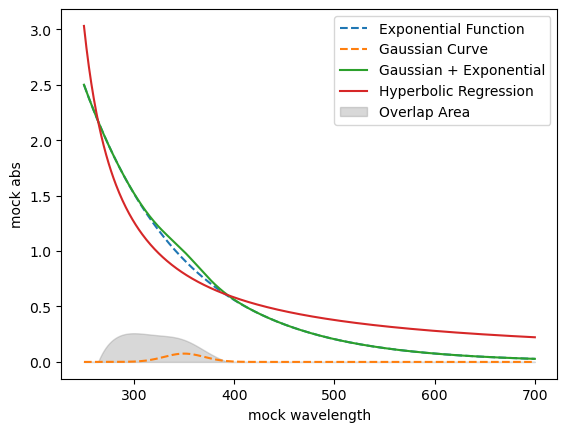

Area between y_added and y_regression: 22.94415645622272


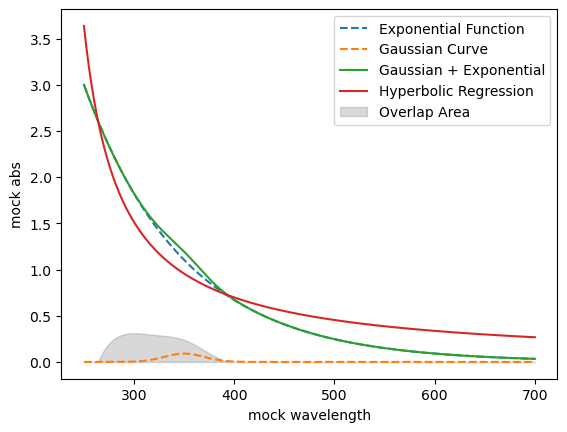

Area between y_added and y_regression: 27.532444188307192


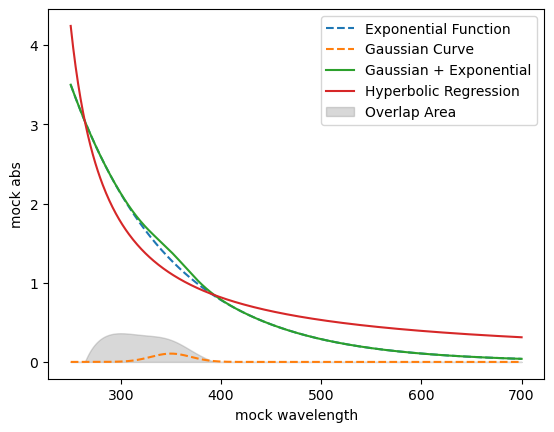

Area between y_added and y_regression: 32.12178196836355


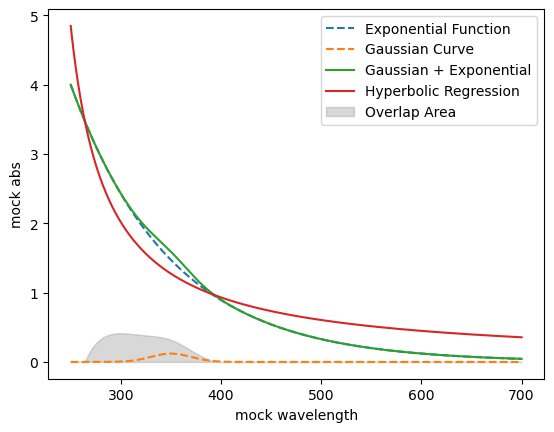

Area between y_added and y_regression: 36.709814936040566


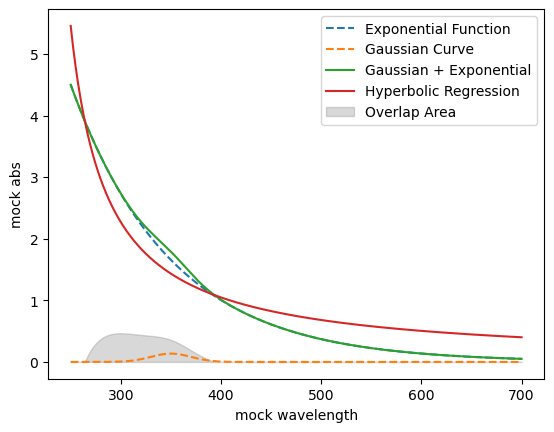

Area between y_added and y_regression: 41.2987320321587


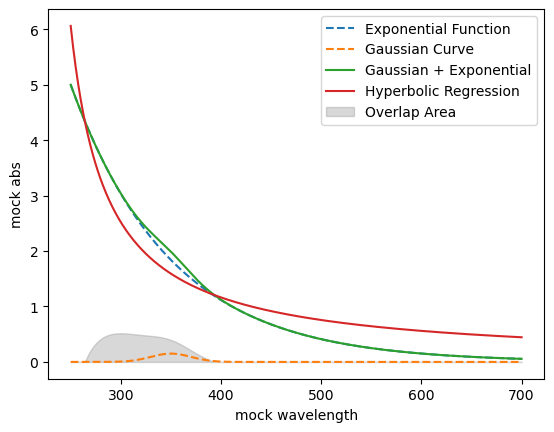

Area between y_added and y_regression: 45.88836802665377


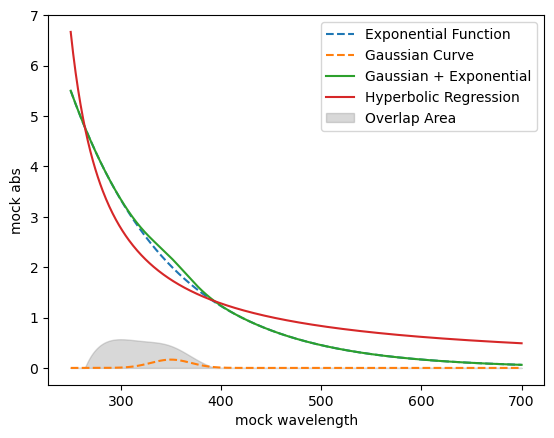

Area between y_added and y_regression: 50.477258338105926


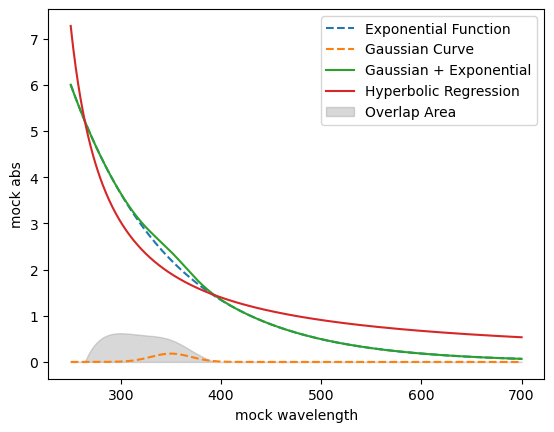

Area between y_added and y_regression: 55.066085240623615


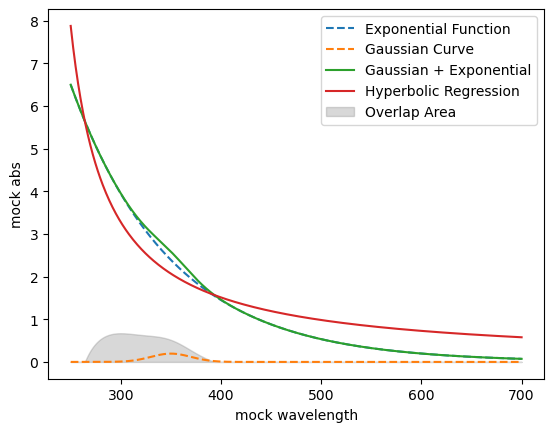

Area between y_added and y_regression: 59.65479881488127


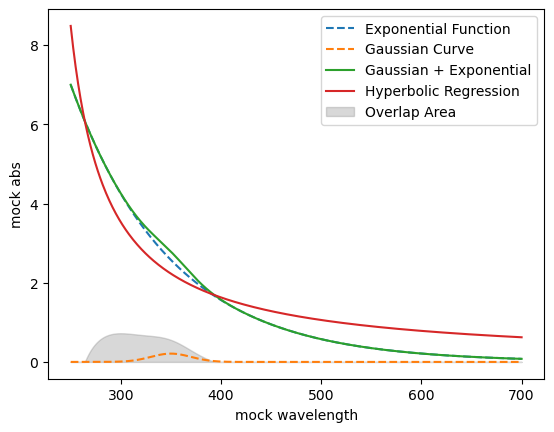

Area between y_added and y_regression: 64.24220119445843


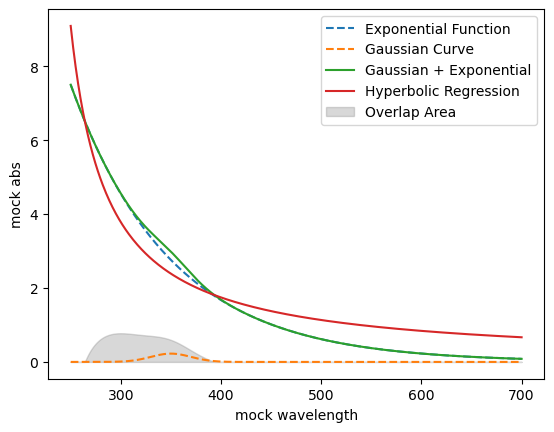

Area between y_added and y_regression: 68.83247804815291


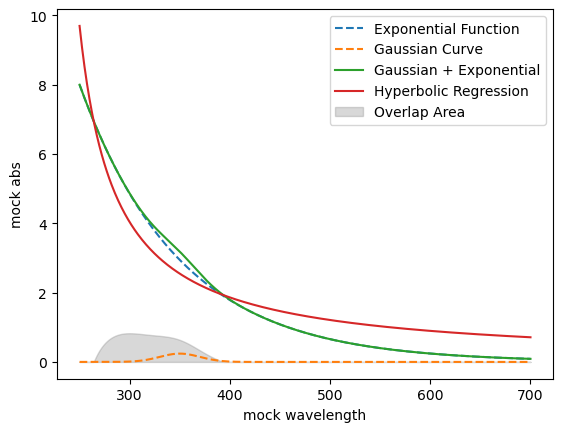

Area between y_added and y_regression: 73.41973354326468


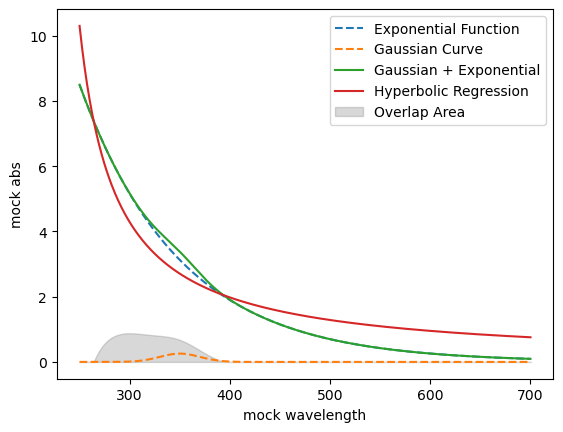

Area between y_added and y_regression: 78.01023173461022


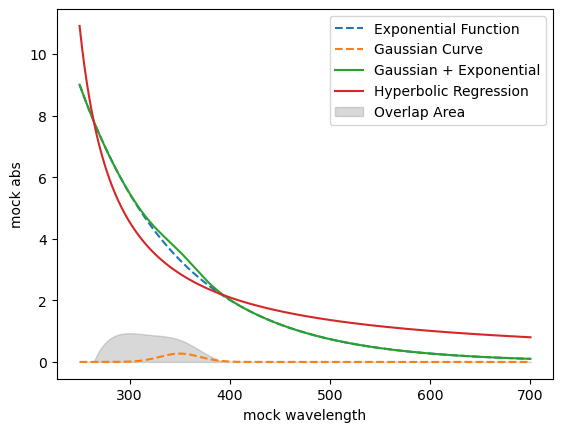

Area between y_added and y_regression: 82.59915093870104


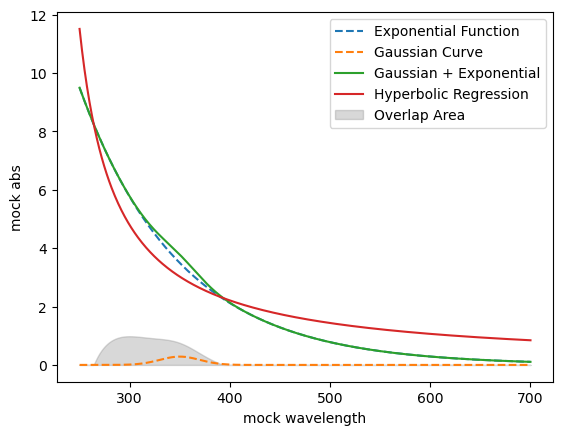

Area between y_added and y_regression: 87.18791773223246


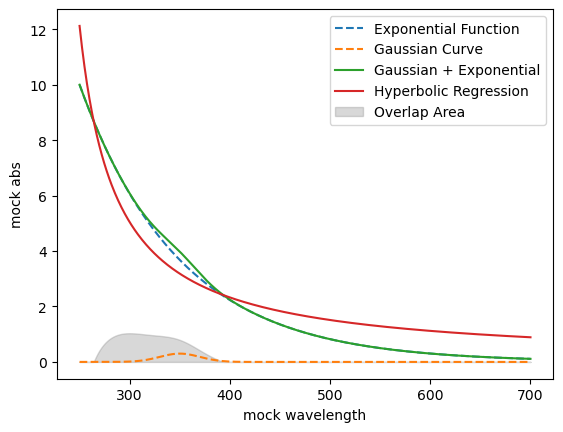

Area between y_added and y_regression: 91.77660716030402


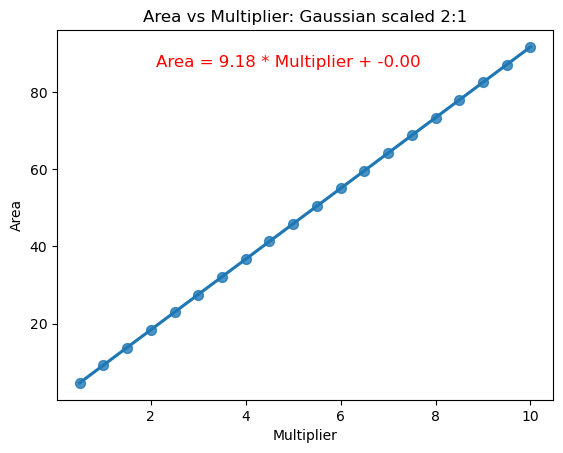

In [13]:
Frames = []

multiplier_values = np.arange(.5, 10.5, 0.5)


for multiplier in multiplier_values:
    scale_experiment(multiplier,1,0.03)

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian scaled 2:1')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

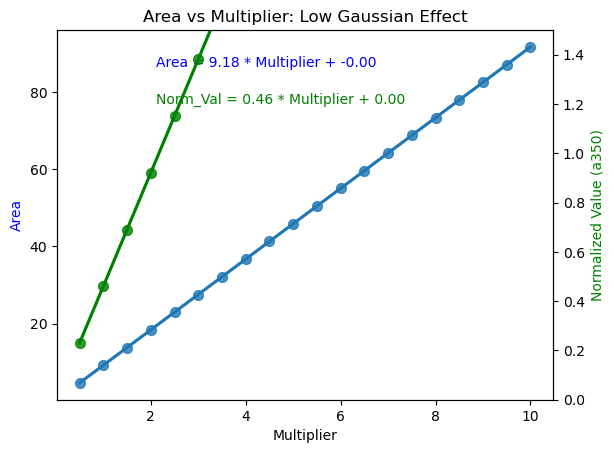

In [14]:
# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplyer', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a350)', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplyer'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

ax2.set_ylim([0,1.5])

plt.title('Area vs Multiplier: Low Gaussian Effect')
plt.show()

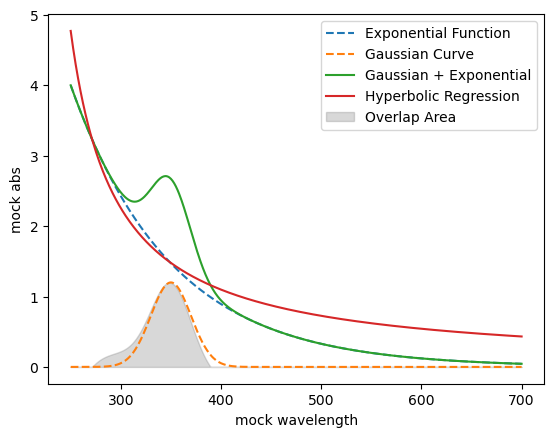

Area between y_added and y_regression: 63.513738400395674


,multiplyer,area,norm_val,area_normalized
0,4,63.513738,2.561495,24.79557


In [15]:
# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 1
b_exp = -0.01  # Adjusted to make the value 1 at x = 250

# Set parameters for the Gaussian function
mean_gaussian = 350
std_gaussian = 20

def scale_experiment(multiplyer, exp_scale, gaus_scale): 
    
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp*multiplyer*exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplyer*gaus_scale) 

    y_added = y_exp + y_gaussian 
    # hyperbolic regression
    popt, pcov = curve_fit(hyperbolic_regression, x_values, y_added)
    y_regression = hyperbolic_regression(x_values, *popt)

    #calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[100]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Hyperbolic Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    dict = {'multiplyer':[multiplyer],
            'area':[area],
            'norm_val':[norm_val],
            'area_normalized': [area_n]}
    sums = pd.DataFrame(dict)
    Frames.append(sums)
    
Frames = []

scale_experiment(4, 1, .3)

sums = pd.concat(Frames, axis=0, ignore_index=False)

sums

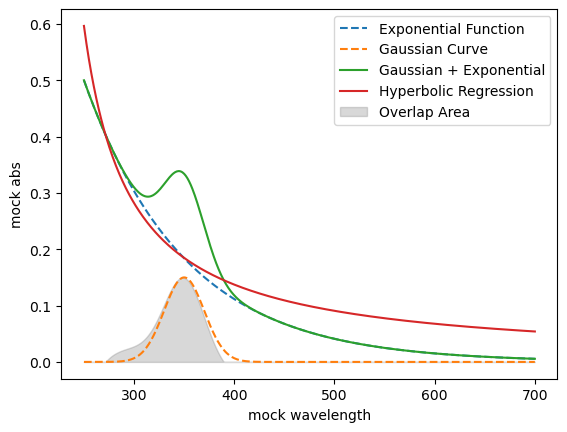

Area between y_added and y_regression: 7.939084437180019


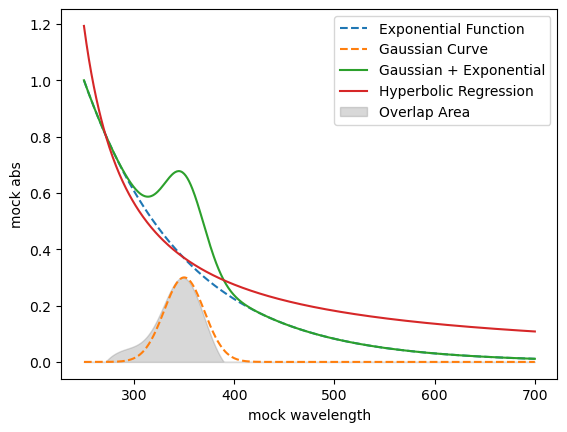

Area between y_added and y_regression: 15.878483640920797


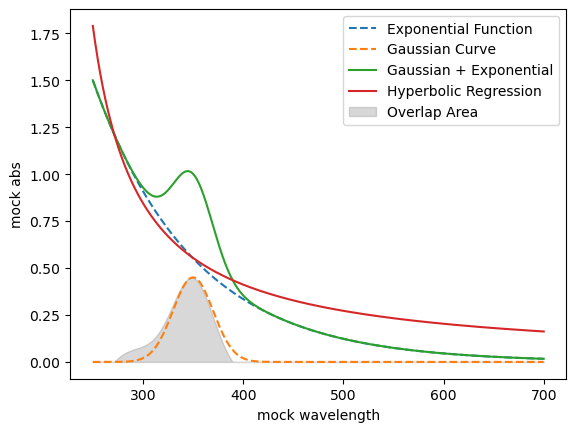

Area between y_added and y_regression: 23.81772578303851


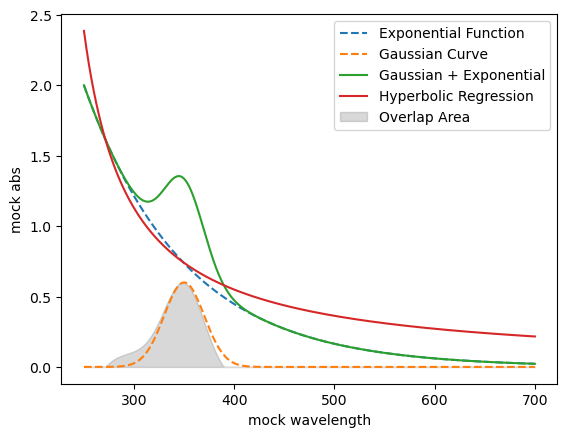

Area between y_added and y_regression: 31.756749742768157


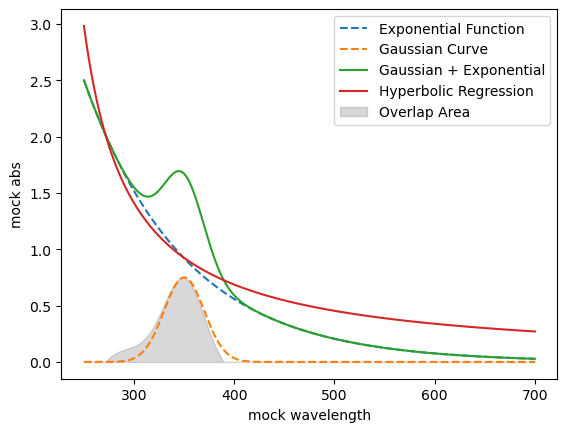

Area between y_added and y_regression: 39.69614709501736


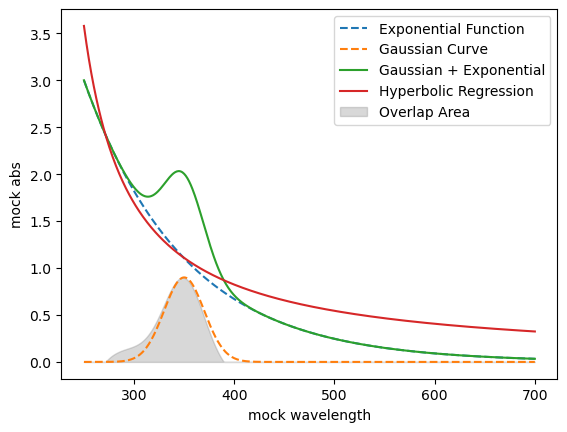

Area between y_added and y_regression: 47.63544205331142


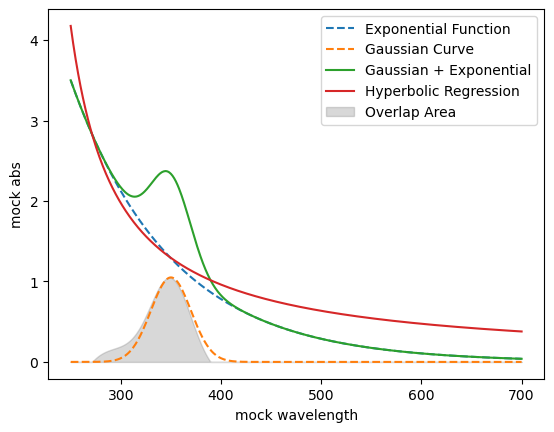

Area between y_added and y_regression: 55.57481513141866


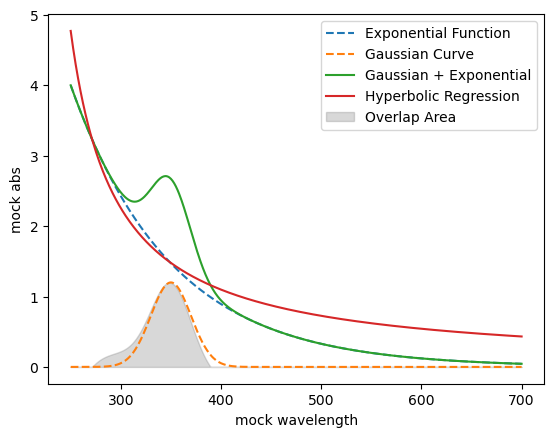

Area between y_added and y_regression: 63.513738400395674


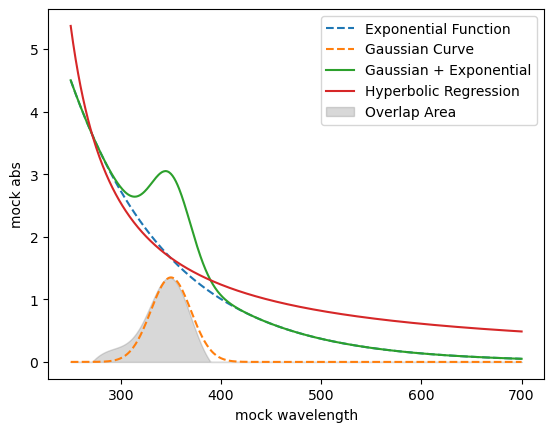

Area between y_added and y_regression: 71.45321761831889


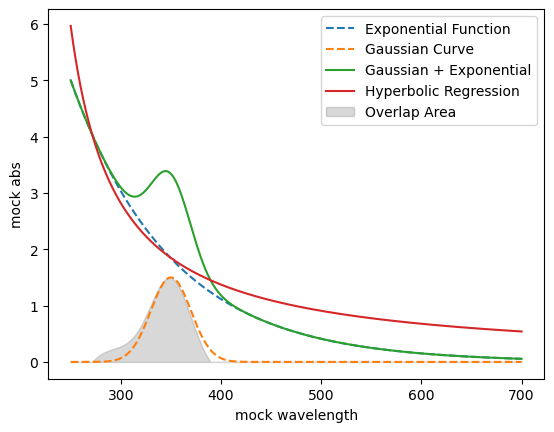

Area between y_added and y_regression: 79.39231593485171


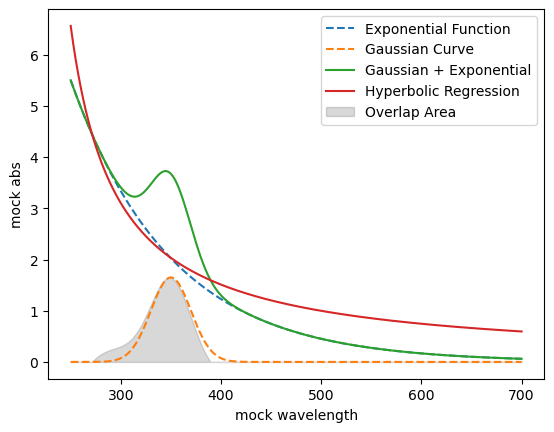

Area between y_added and y_regression: 87.331403248809


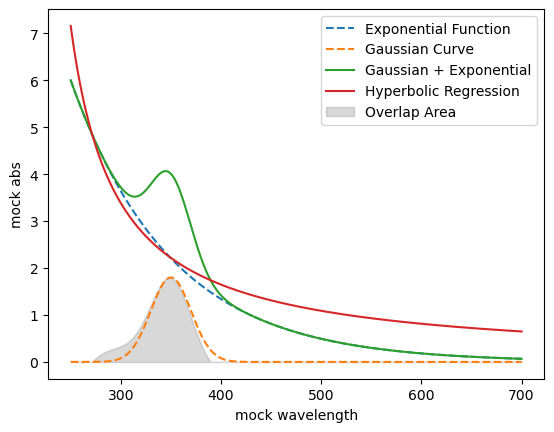

Area between y_added and y_regression: 95.26845858731059


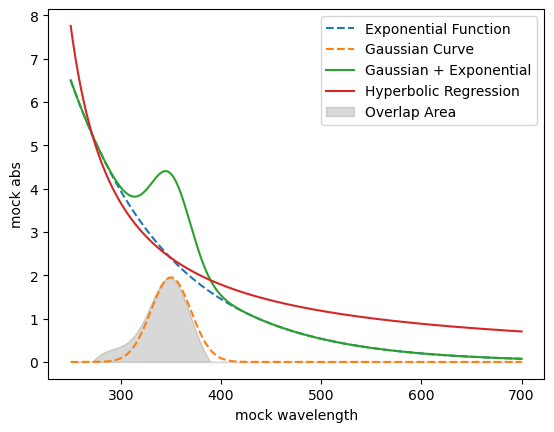

Area between y_added and y_regression: 103.20946399114759


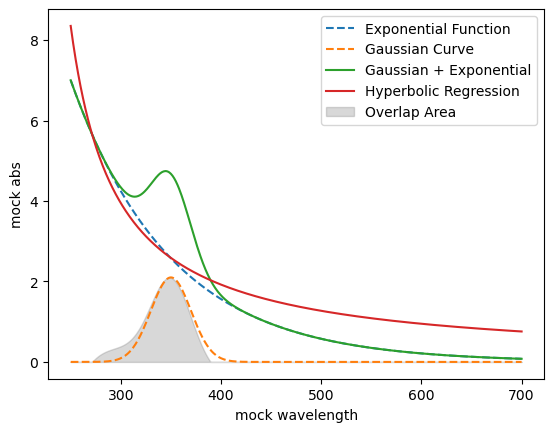

Area between y_added and y_regression: 111.14676184394284


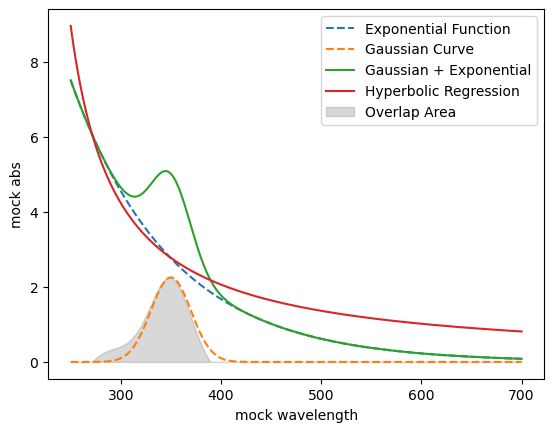

Area between y_added and y_regression: 119.08871278227242


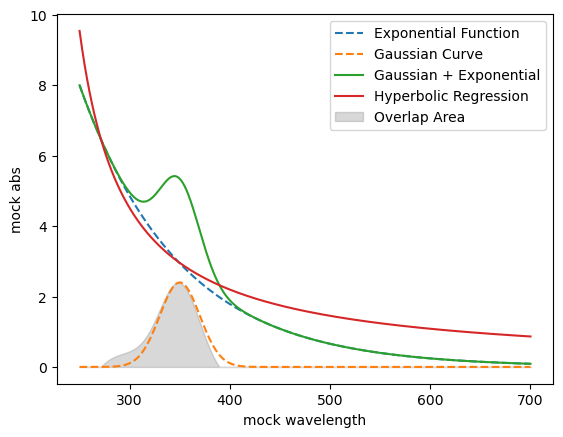

Area between y_added and y_regression: 127.02779369510584


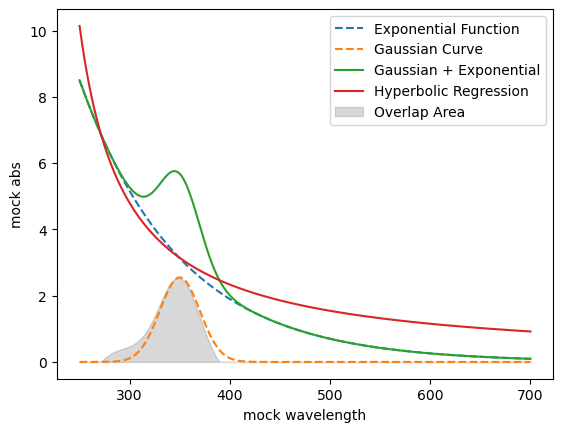

Area between y_added and y_regression: 134.96665338945598


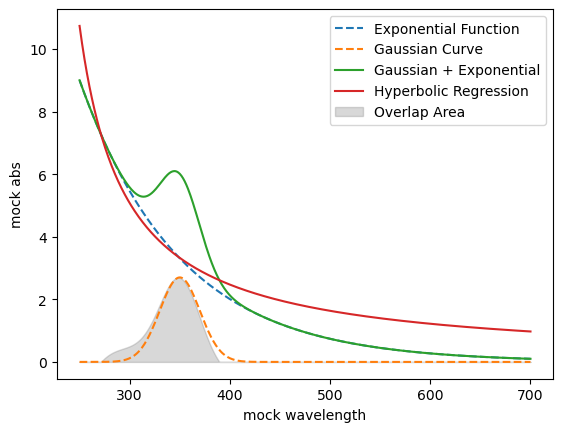

Area between y_added and y_regression: 142.90534891149161


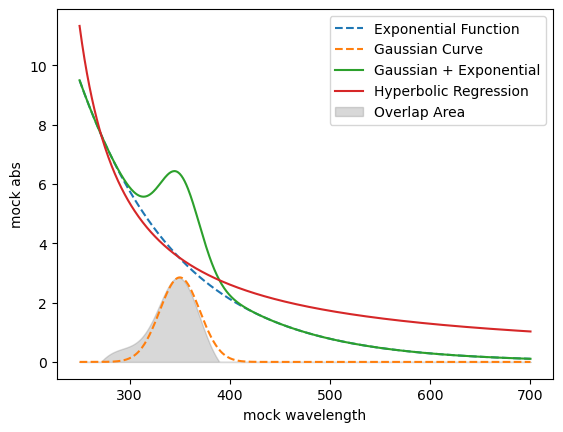

Area between y_added and y_regression: 150.84613203292812


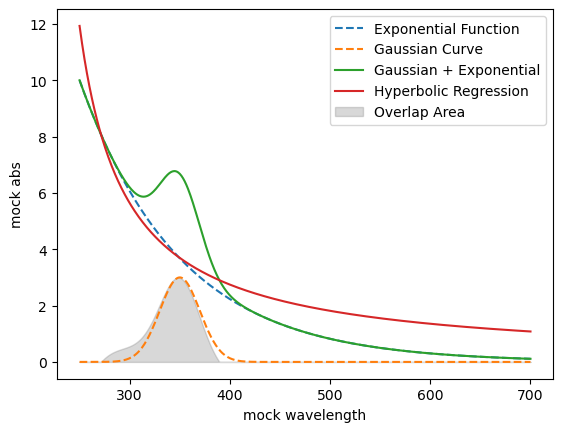

Area between y_added and y_regression: 158.78409885267573


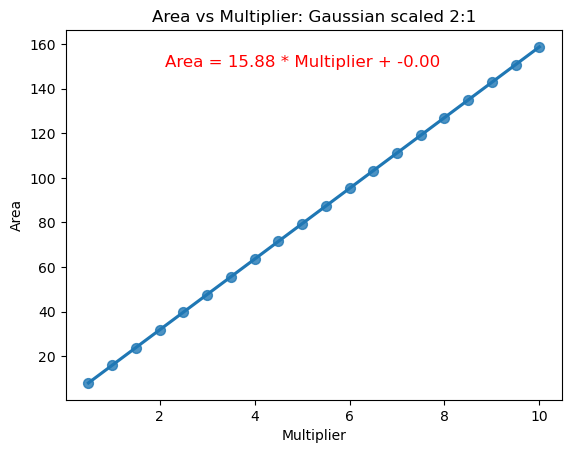

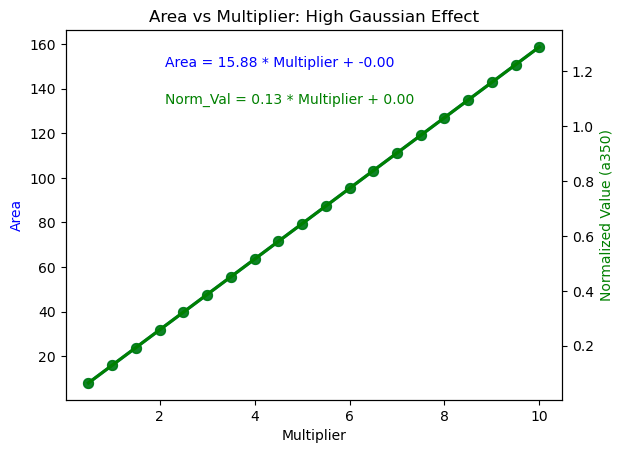

In [16]:
# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the hyperbolic regression function
def hyperbolic_regression(x, a, b):
    return a / (x + b)

# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 1
b_exp = -0.01  # Adjusted to make the value 1 at x = 250

# Set parameters for the Gaussian function
mean_gaussian = 350
std_gaussian = 20

def scale_experiment(multiplyer, exp_scale, gaus_scale): 
    
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp*multiplyer*exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplyer*gaus_scale) 

    y_added = y_exp + y_gaussian 
    # hyperbolic regression
    popt, pcov = curve_fit(hyperbolic_regression, x_values, y_added)
    y_regression = hyperbolic_regression(x_values, *popt)

    #calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[250]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Hyperbolic Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    dict = {'multiplyer':[multiplyer],
            'area':[area],
            'norm_val':[norm_val],
            'area_normalized': [area_n]}
    sums = pd.DataFrame(dict)
    Frames.append(sums)
    
Frames = []

multiplier_values = np.arange(.5, 10.5, 0.5)


for multiplier in multiplier_values:
    scale_experiment(multiplier,1,.3)

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian scaled 2:1')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplyer', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a350)', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplyer'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

plt.title('Area vs Multiplier: High Gaussian Effect')
plt.show()

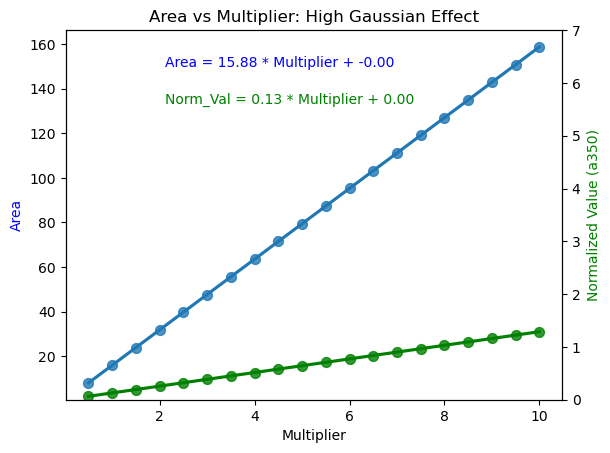

In [17]:
# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplyer', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplyer', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a350)', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplyer'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplyer'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

ax2.set_ylim([0,7])

plt.title('Area vs Multiplier: High Gaussian Effect')
plt.show()

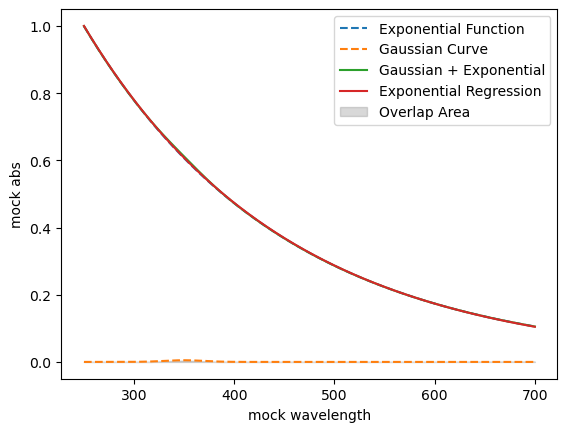

Area between y_added and y_regression: 0.18226375452726573


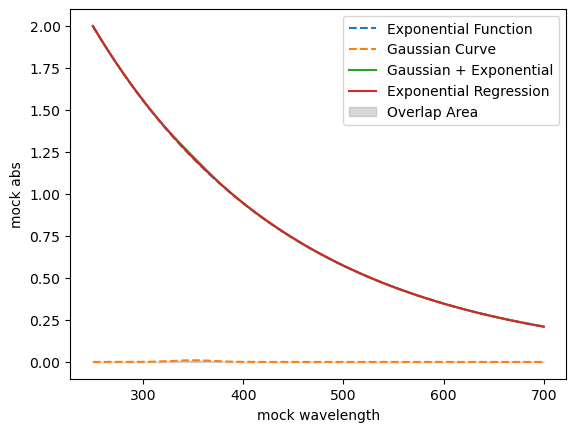

Area between y_added and y_regression: 0.36452675538532253


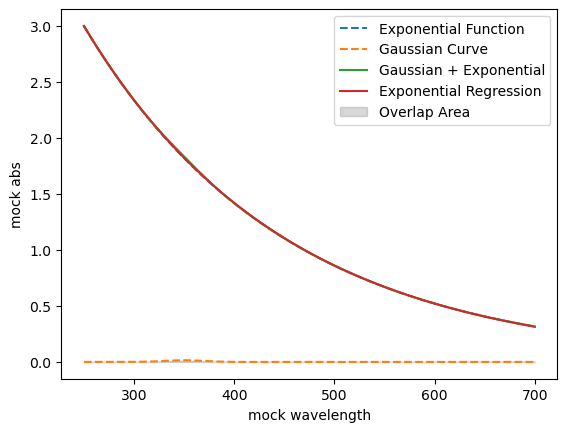

Area between y_added and y_regression: 0.5467917904541257


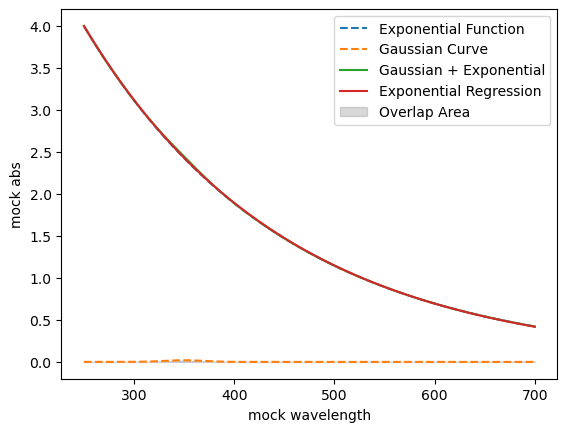

Area between y_added and y_regression: 0.7290551955920768


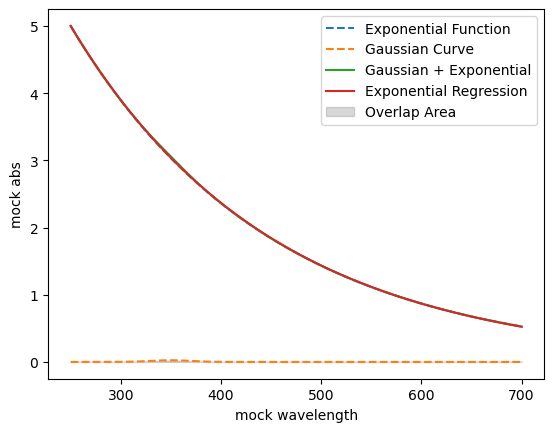

Area between y_added and y_regression: 0.911317525261512


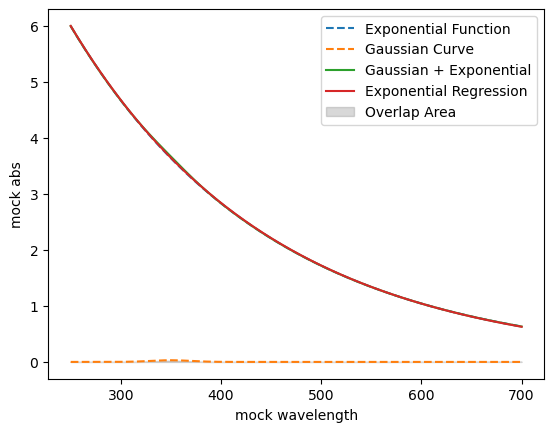

Area between y_added and y_regression: 1.093581943827671


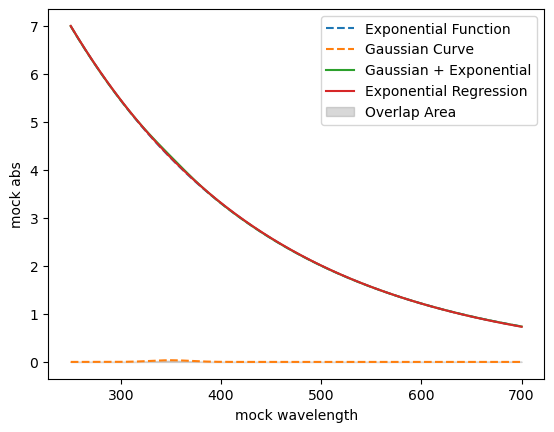

Area between y_added and y_regression: 1.275845179229139


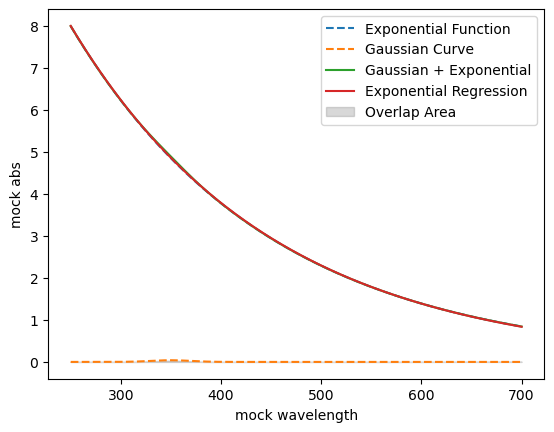

Area between y_added and y_regression: 1.4581097637036167


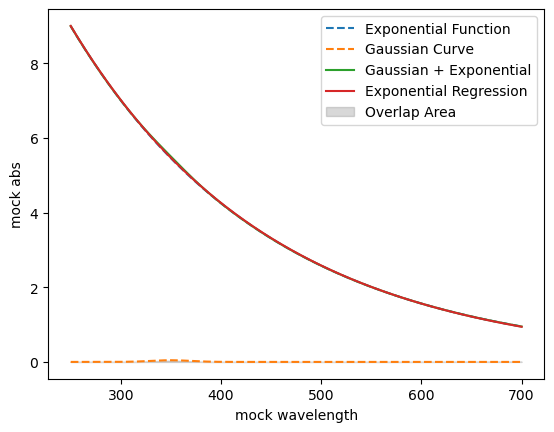

Area between y_added and y_regression: 1.640375897793101


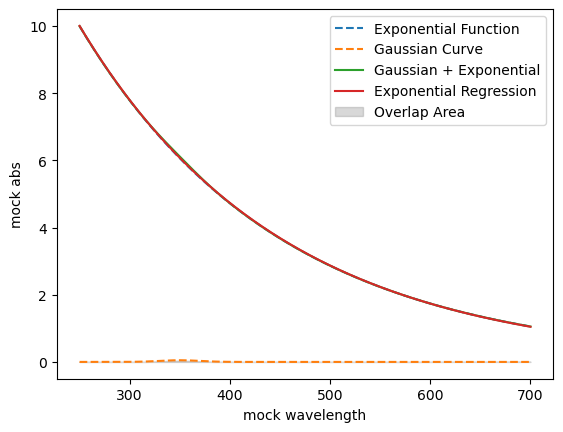

Area between y_added and y_regression: 1.822635137079889


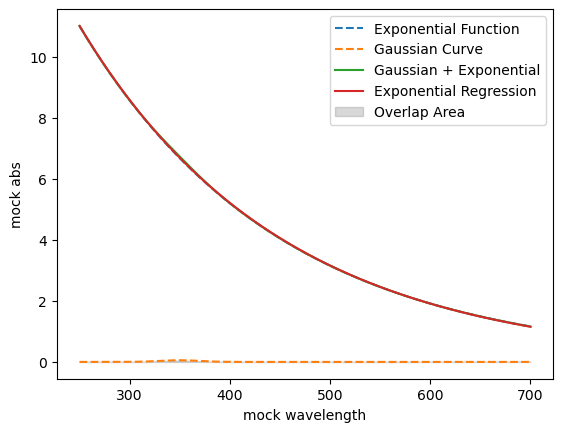

Area between y_added and y_regression: 2.004902166404148


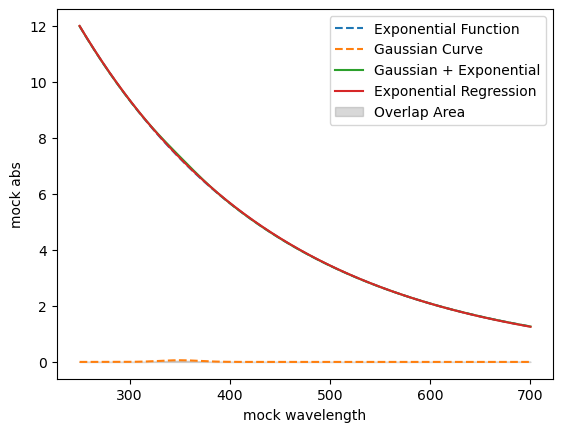

Area between y_added and y_regression: 2.1871647096092186


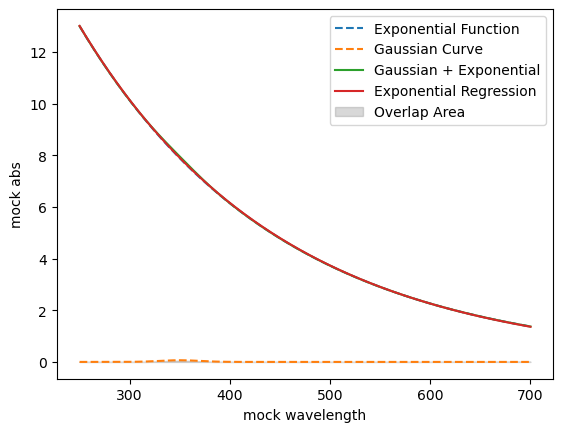

Area between y_added and y_regression: 2.369428359636854


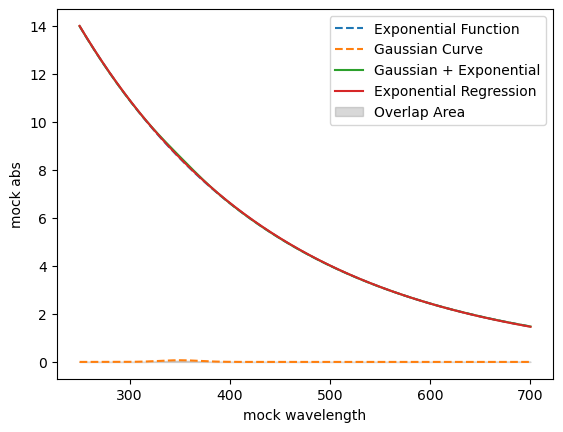

Area between y_added and y_regression: 2.551696967484947


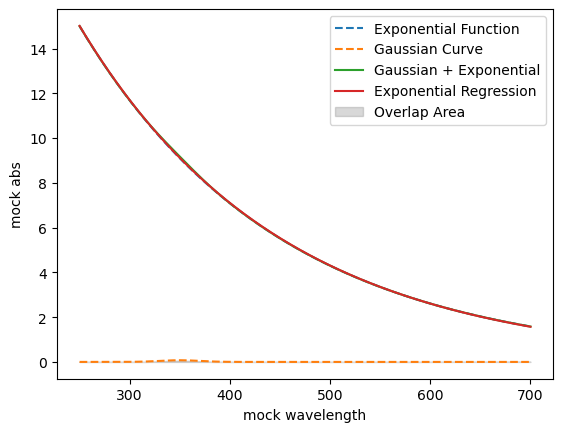

Area between y_added and y_regression: 2.7339595437488167


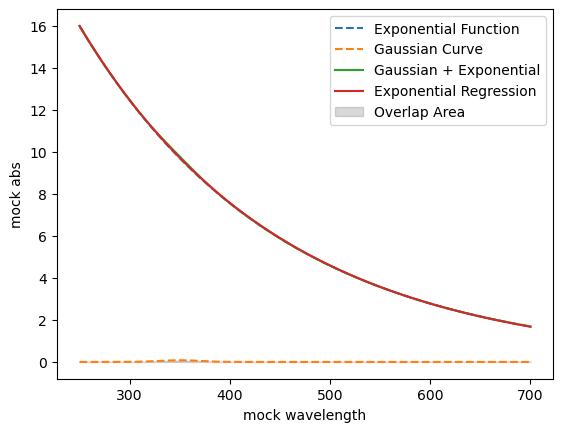

Area between y_added and y_regression: 2.916217055246268


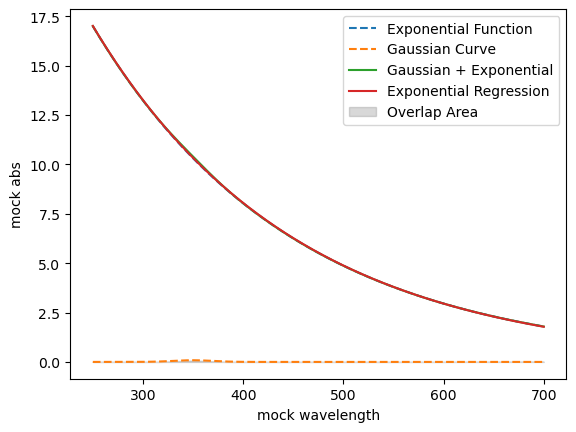

Area between y_added and y_regression: 3.098483446593733


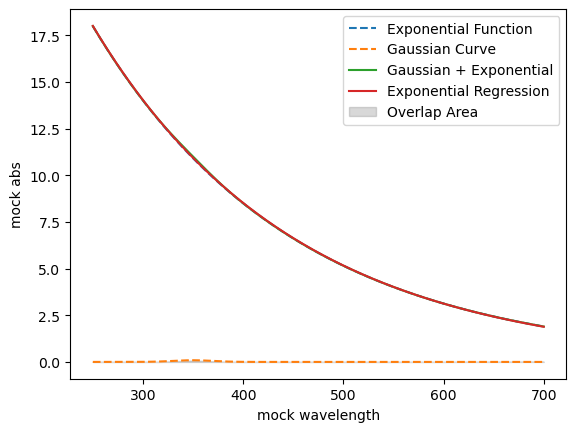

Area between y_added and y_regression: 3.2807483637638697


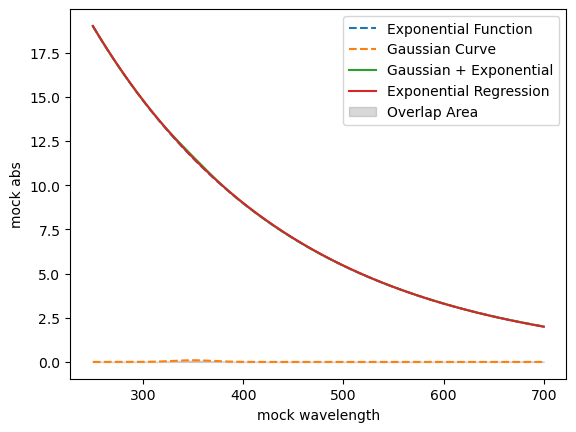

Area between y_added and y_regression: 3.463014160963076


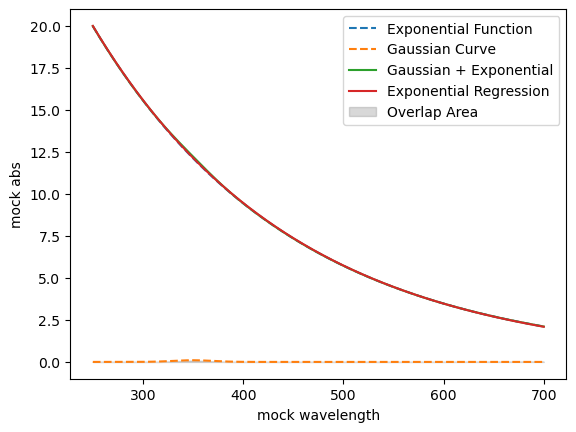

Area between y_added and y_regression: 3.6452745369334463


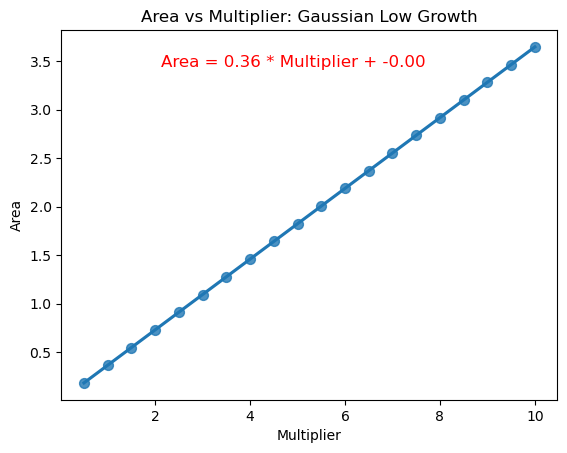

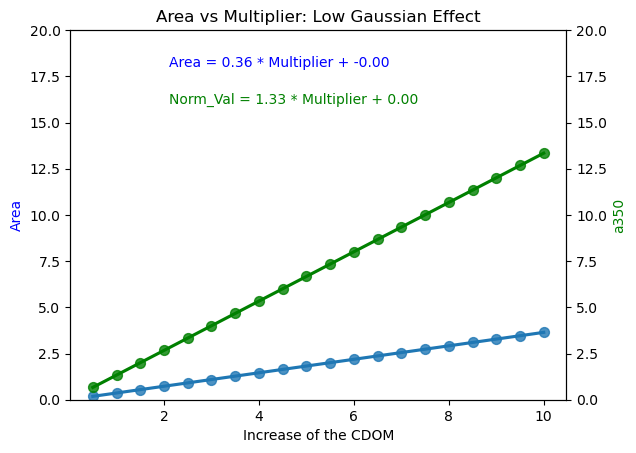

In [18]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.integrate import trapz

# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the exponential regression function
def exponential_regression(x, a, b, c):
    return a * np.exp(b * (x - 250)) + c

# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 2  # Increase amplitude
b_exp = -0.005  # Decrease slope

def scale_experiment(multiplier, exp_scale, gaus_scale):
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp * multiplier * exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplier * gaus_scale)

    y_added = y_exp + y_gaussian 
    # Exponential regression
    popt, pcov = curve_fit(exponential_regression, x_values, y_added, p0=[1, -0.01, 1])
    y_regression = exponential_regression(x_values, *popt)

    # Calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[100]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Exponential Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    data_dict = {'multiplier': [multiplier],
                 'area': [area],
                 'norm_val': [norm_val],
                 'area_normalized': [area_n]}
    frame = pd.DataFrame(data_dict)
    Frames.append(frame)

Frames = []

multiplier_values = np.arange(0.5, 10.5, 0.5)

for multiplier in multiplier_values:
    scale_experiment(multiplier, 1, .01) # a350 increase doubble rate area 
    #scale_experiment(multiplier, 1, .1) # a350 increase half rate as area

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian Low Growth')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Increase of the CDOM')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplier', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='a350')
ax2.set_ylabel('a350', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplier'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

ax1.set_ylim([0,20])
ax2.set_ylim([0,20])

plt.title('Area vs Multiplier: Low Gaussian Effect')
plt.show()


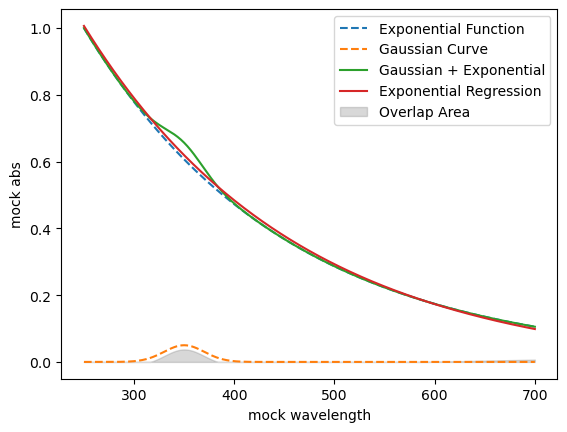

Area between y_added and y_regression: 1.8200673160750265


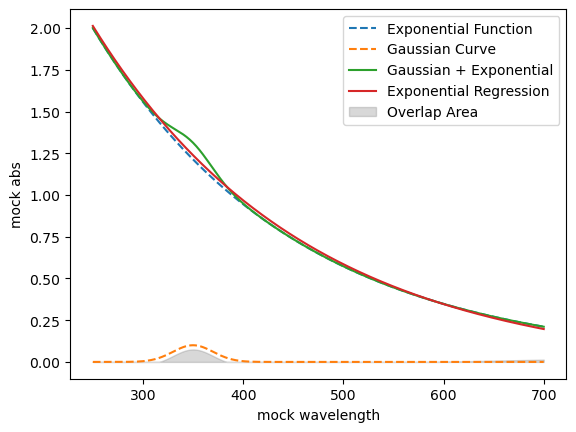

Area between y_added and y_regression: 3.640141429740531


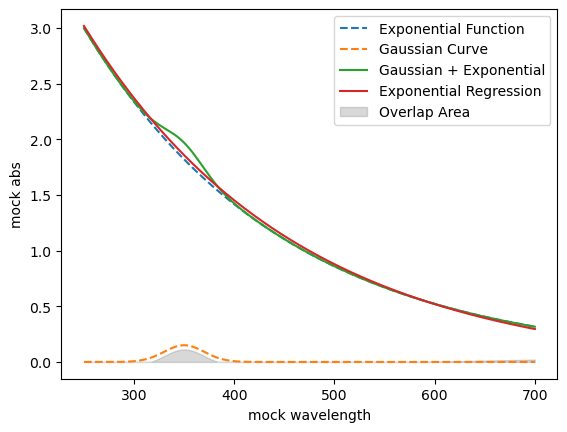

Area between y_added and y_regression: 5.460210902636764


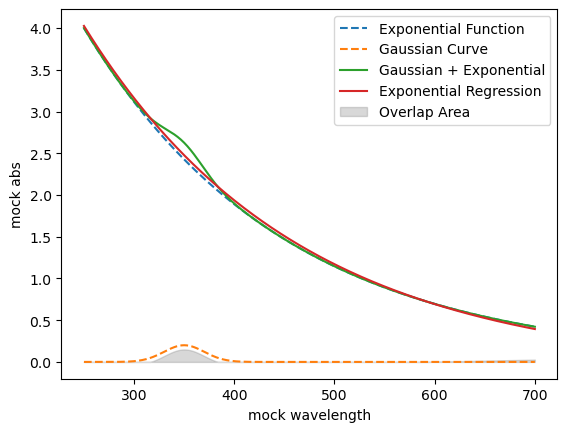

Area between y_added and y_regression: 7.280270494976186


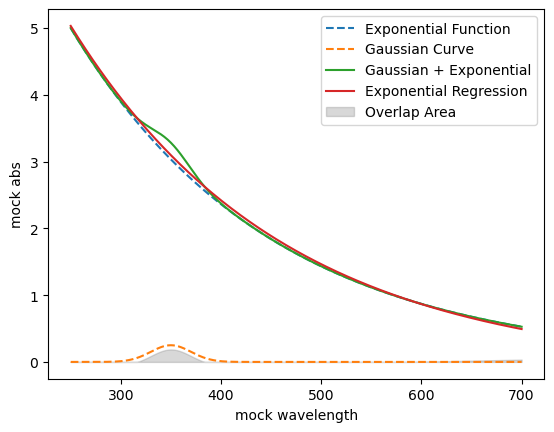

Area between y_added and y_regression: 9.100342083371595


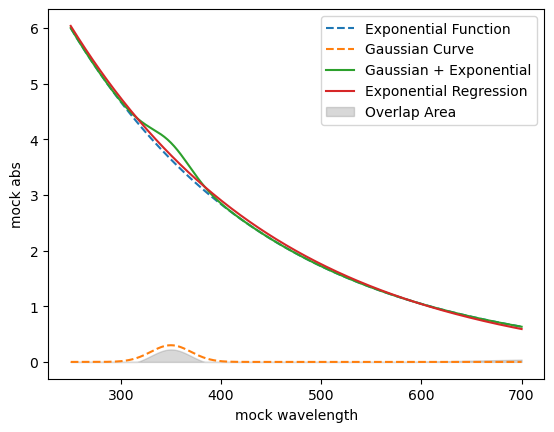

Area between y_added and y_regression: 10.920414970033963


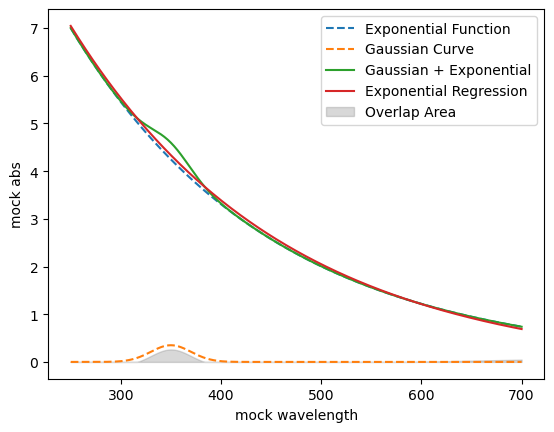

Area between y_added and y_regression: 12.740475826336187


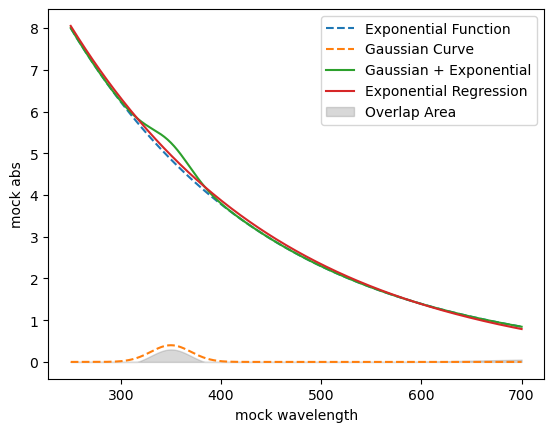

Area between y_added and y_regression: 14.560528231321207


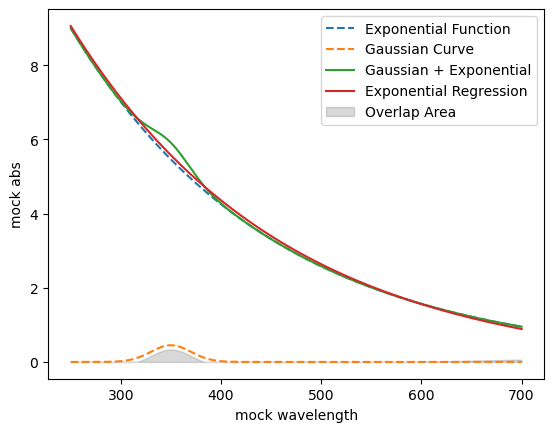

Area between y_added and y_regression: 16.380614915389778


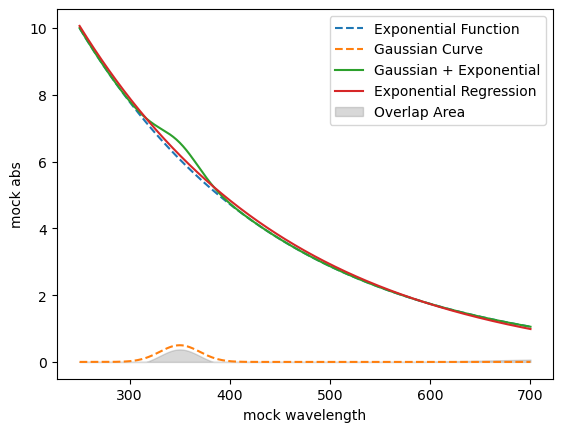

Area between y_added and y_regression: 18.200680506283856


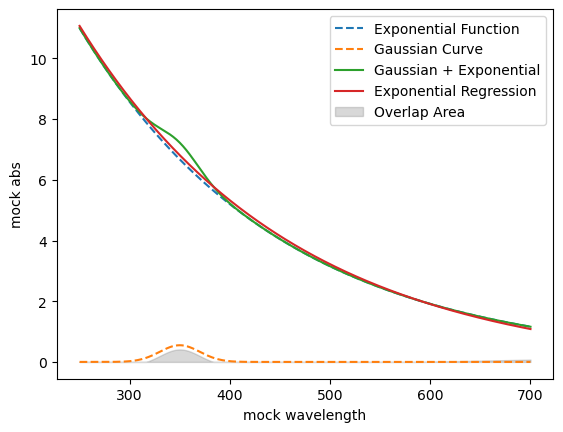

Area between y_added and y_regression: 20.020753275795176


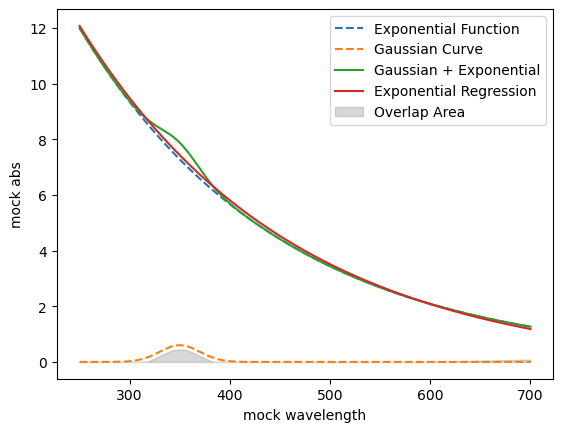

Area between y_added and y_regression: 21.840818927427144


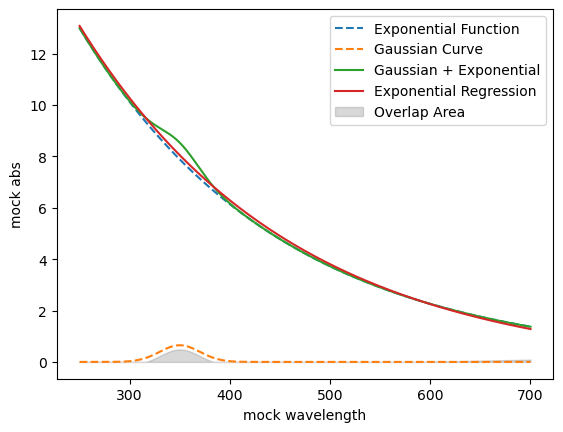

Area between y_added and y_regression: 23.66088759554575


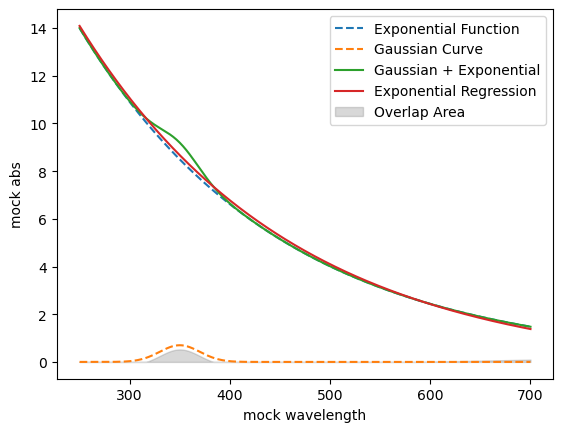

Area between y_added and y_regression: 25.480966907899603


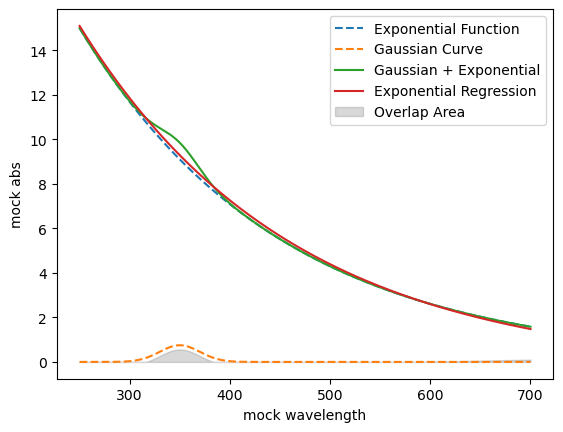

Area between y_added and y_regression: 27.301015066892063


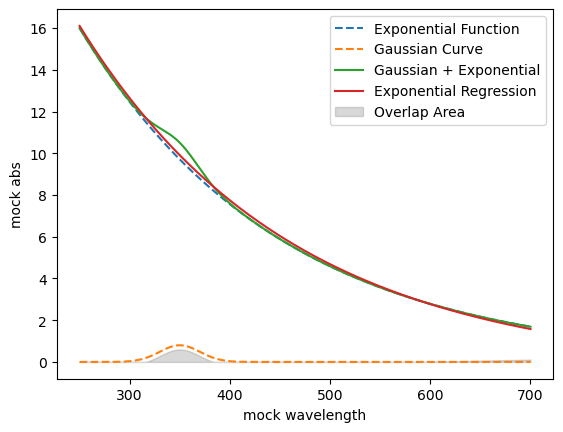

Area between y_added and y_regression: 29.121130737360776


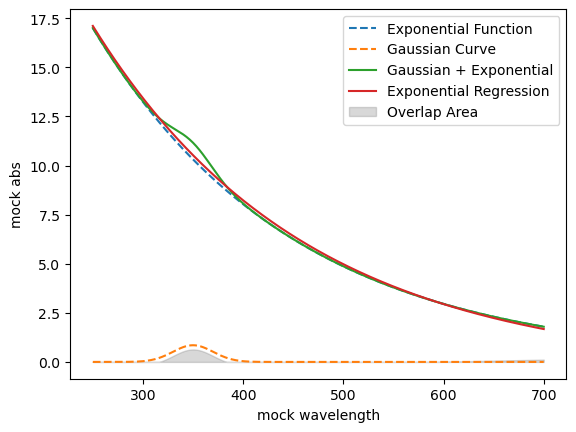

Area between y_added and y_regression: 30.941171414433633


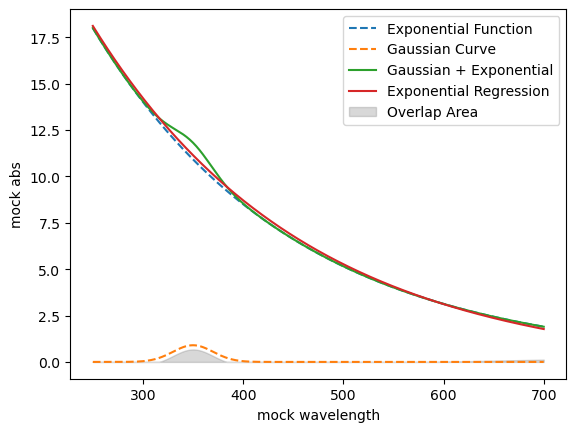

Area between y_added and y_regression: 32.76124204468963


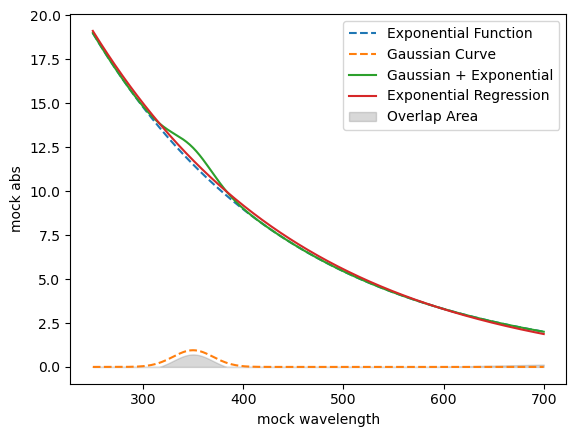

Area between y_added and y_regression: 34.581271016640706


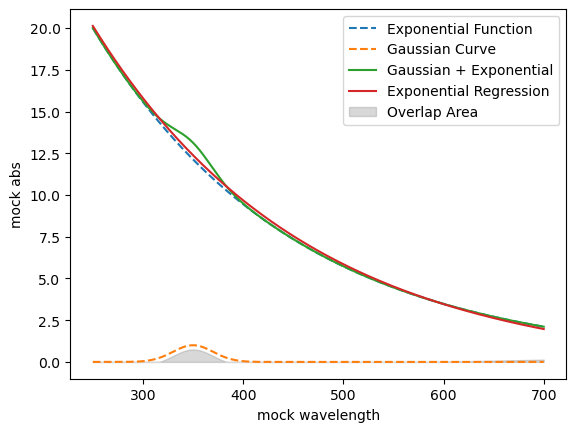

Area between y_added and y_regression: 36.40137343398221


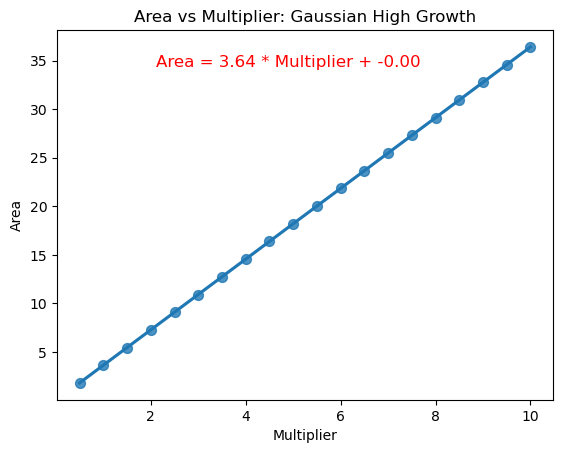

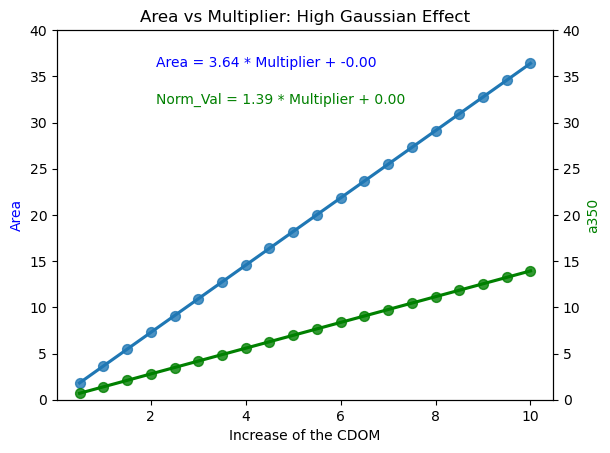

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.integrate import trapz

# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the exponential regression function
def exponential_regression(x, a, b, c):
    return a * np.exp(b * (x - 250)) + c

# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 2  # Increase amplitude
b_exp = -0.005  # Decrease slope

def scale_experiment(multiplier, exp_scale, gaus_scale):
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp * multiplier * exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplier * gaus_scale)

    y_added = y_exp + y_gaussian 
    # Exponential regression
    popt, pcov = curve_fit(exponential_regression, x_values, y_added, p0=[1, -0.01, 1])
    y_regression = exponential_regression(x_values, *popt)

    # Calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[100]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Exponential Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    data_dict = {'multiplier': [multiplier],
                 'area': [area],
                 'norm_val': [norm_val],
                 'area_normalized': [area_n]}
    frame = pd.DataFrame(data_dict)
    Frames.append(frame)

Frames = []

multiplier_values = np.arange(0.5, 10.5, 0.5)

for multiplier in multiplier_values:
    #scale_experiment(multiplier, 1, .01) # a350 increase doubble rate area 
    scale_experiment(multiplier, 1, .1) # a350 increase half rate as area

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian High Growth')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Increase of the CDOM')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplier', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='a350')
ax2.set_ylabel('a350', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplier'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

ax1.set_ylim([0,40])
ax2.set_ylim([0,40])

plt.title('Area vs Multiplier: High Gaussian Effect')
plt.show()


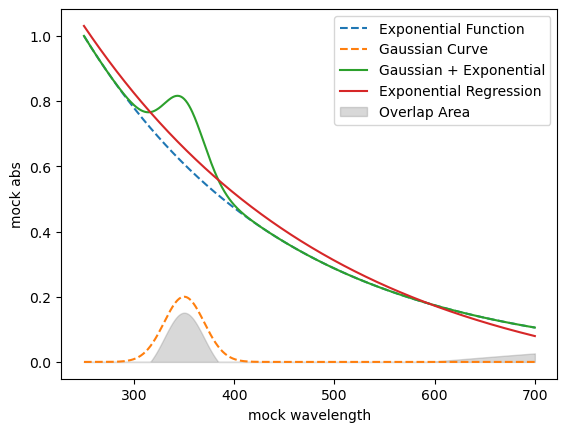

Area between y_added and y_regression: 7.249250542504024


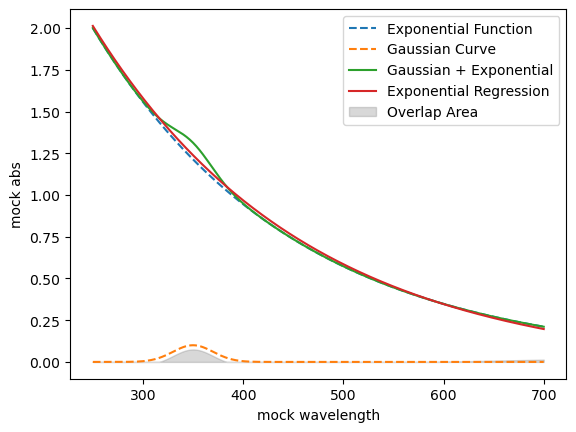

Area between y_added and y_regression: 3.64014139500896


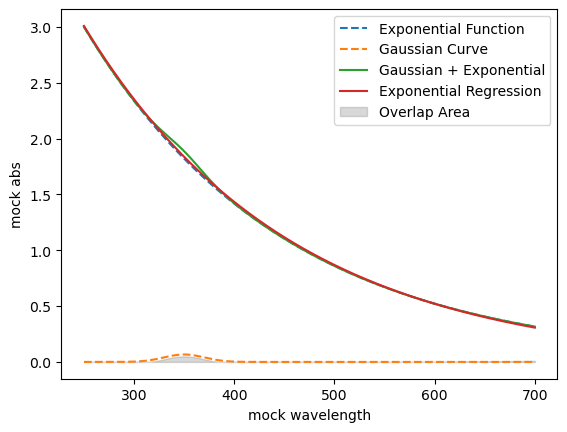

Area between y_added and y_regression: 2.4288505380710315


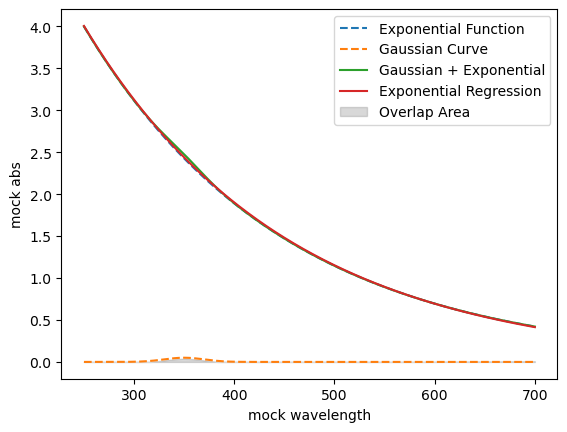

Area between y_added and y_regression: 1.8222019387088402


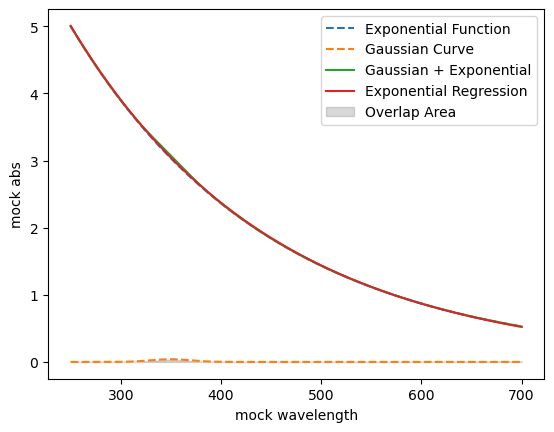

Area between y_added and y_regression: 1.4579720288746825


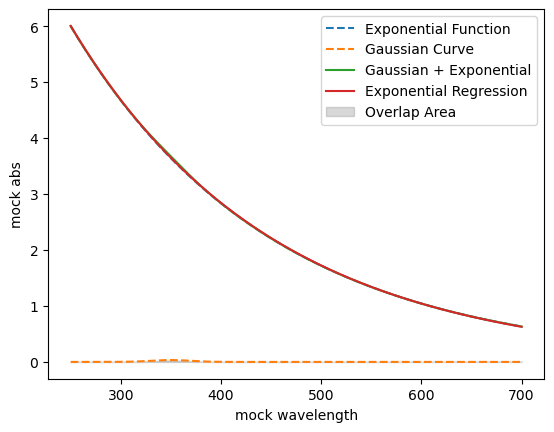

Area between y_added and y_regression: 1.2150710554866682


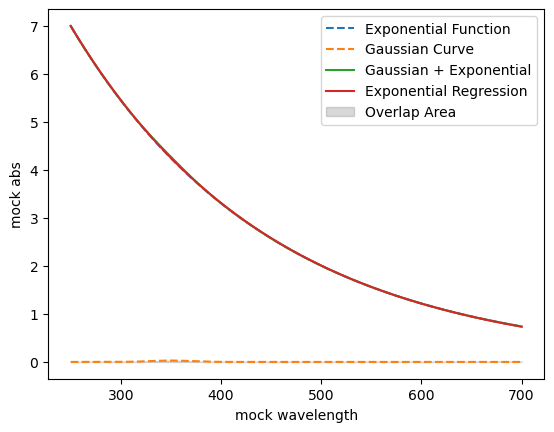

Area between y_added and y_regression: 1.0415397780034865


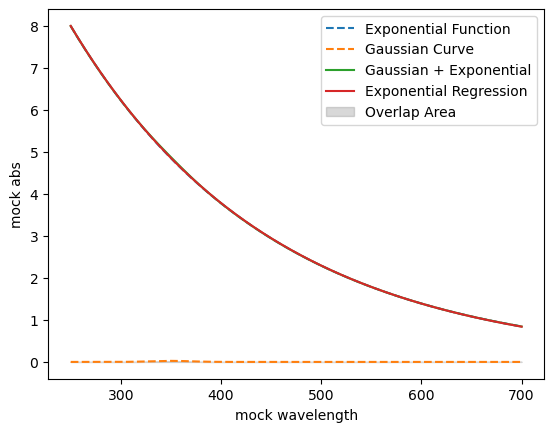

Area between y_added and y_regression: 0.9113745341221047


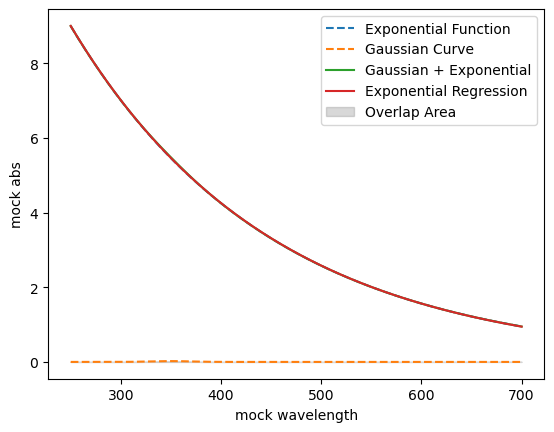

Area between y_added and y_regression: 0.8101268519303051


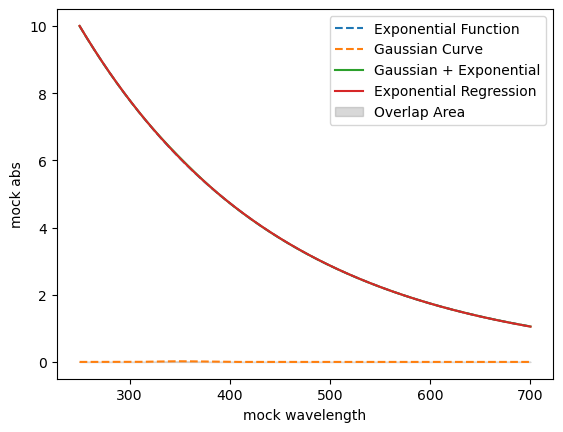

Area between y_added and y_regression: 0.7291257650267085


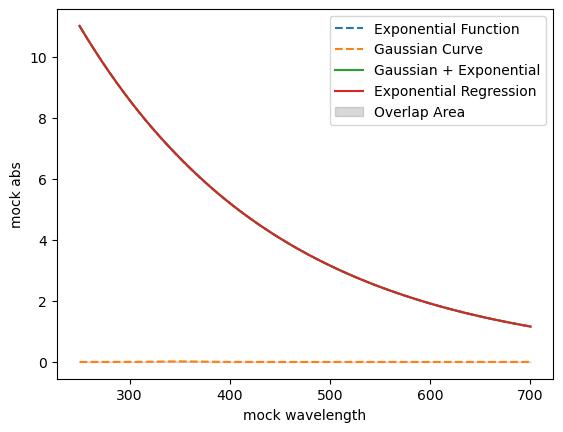

Area between y_added and y_regression: 0.6628502093981539


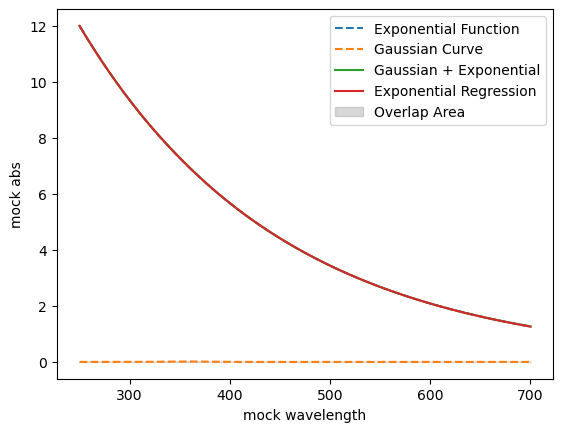

Area between y_added and y_regression: 0.6076155193878783


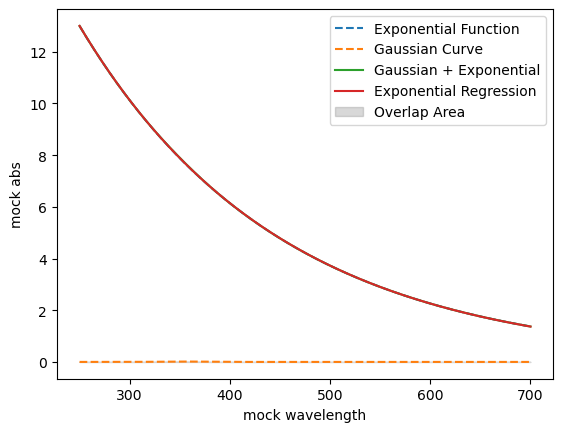

Area between y_added and y_regression: 0.5608797958550278


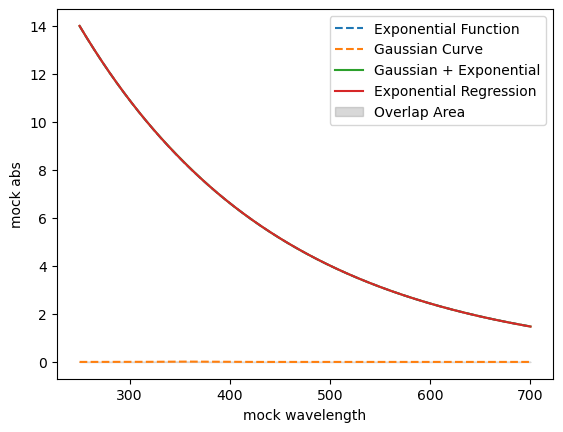

Area between y_added and y_regression: 0.5208174730697488


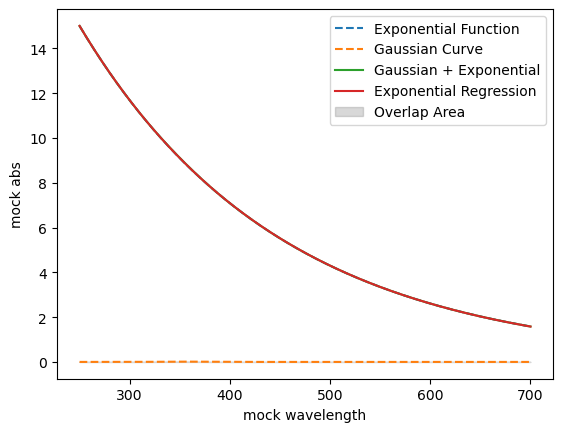

Area between y_added and y_regression: 0.48609978808739335


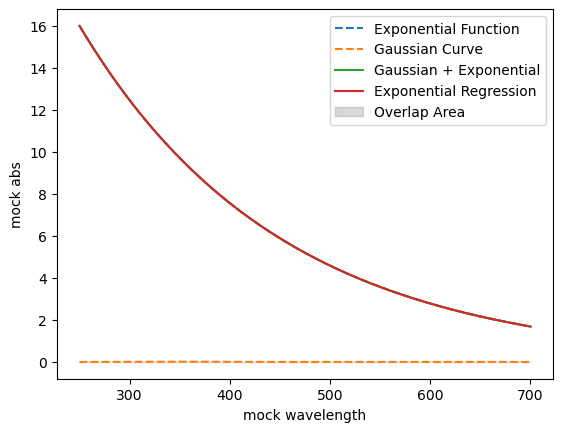

Area between y_added and y_regression: 0.4557204187610905


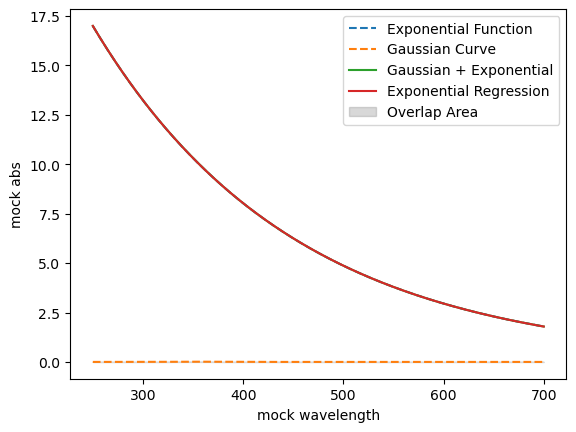

Area between y_added and y_regression: 0.4289139917421363


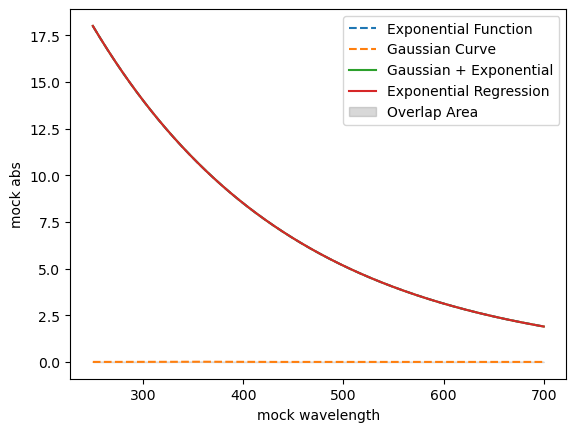

Area between y_added and y_regression: 0.40508236313013124


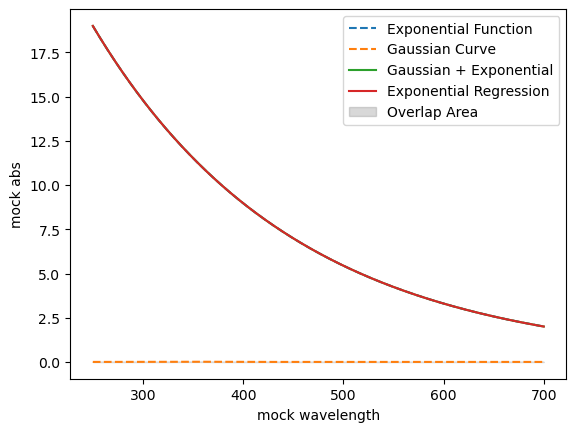

Area between y_added and y_regression: 0.38376816618865084


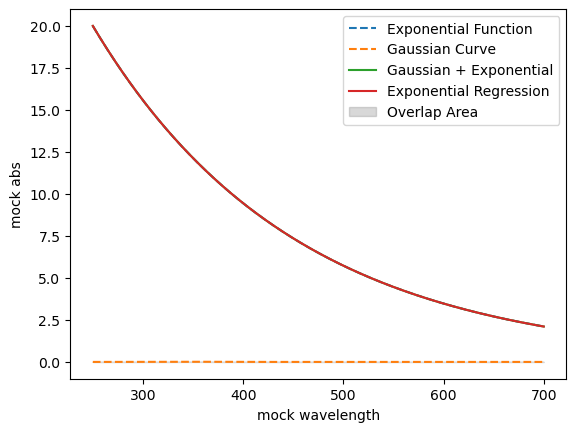

Area between y_added and y_regression: 0.3645795751166429


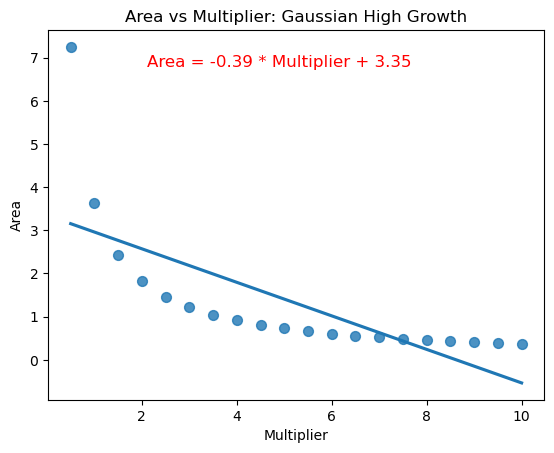

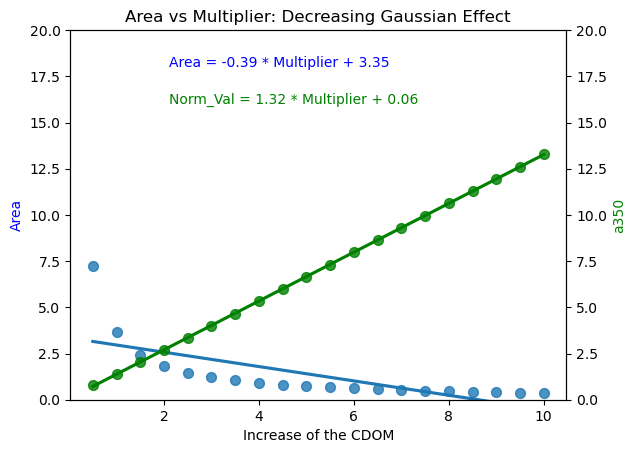

In [20]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.integrate import trapz

# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the exponential regression function
def exponential_regression(x, a, b, c):
    return a * np.exp(b * (x - 250)) + c

# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 2  # Increase amplitude
b_exp = -0.005  # Decrease slope

mean_gaussian = 350
std_gaussian = 20

def scale_experiment(multiplier, exp_scale, gaus_scale):
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp * multiplier * exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() * (multiplier / gaus_scale)

    y_added = y_exp + y_gaussian 
    # Exponential regression
    popt, pcov = curve_fit(exponential_regression, x_values, y_added, p0=[1, -0.01, 1])
    y_regression = exponential_regression(x_values, *popt)

    # Calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[100]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='Exponential Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    data_dict = {'multiplier': [multiplier],
                 'area': [area],
                 'norm_val': [norm_val],
                 'area_normalized': [area_n]}
    frame = pd.DataFrame(data_dict)
    Frames.append(frame)

Frames = []

multiplier_values = np.arange(0.5, 10.5, 0.5)

for multiplier in multiplier_values:
    #scale_experiment(multiplier, 1, .01) # a350 increase doubble rate area 
    scale_experiment(multiplier, 1, .1) # a350 increase half rate as area

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian High Growth')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Increase of the CDOM')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplier', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='a350')
ax2.set_ylabel('a350', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplier'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

ax1.set_ylim([0,20])
ax2.set_ylim([0,20])

plt.title('Area vs Multiplier: Decreasing Gaussian Effect')
plt.show()


In [21]:
multiplier_values

array([ 0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,
        6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. ])

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.integrate import trapz

# Define the exponential function
def exponential_function(x, a, b):
    return a * np.exp(b * (x - 250))

# Define the Gaussian function
def gaussian_function(x, mean, std):
    return np.exp(-0.5 * ((x - mean) / std) ** 2) / (std * np.sqrt(2 * np.pi))

# Define the hyperbolic regression function
def hyperbolic_regression(x, a, b):
    return a / (x + b)


# Generate x values
x_values = np.linspace(250, 700, 550)

# Set parameters for the exponential function
a_exp = 1
b_exp = -0.01  # Adjusted to make the value 1 at x = 250

def scale_experiment(multiplier, exp_scale, gaus_scale):
    # Calculate y values for both functions
    y_exp = exponential_function(x_values, a_exp * multiplier * exp_scale, b_exp)
    y_gaussian = gaussian_function(x_values, mean_gaussian, std_gaussian)

    # Normalize the Gaussian function to have a maximum value of 1
    y_gaussian /= y_gaussian.max() / (multiplier * gaus_scale)

    y_added = y_exp + y_gaussian 
    # Exponential regression
    popt, pcov = curve_fit(hyperbolic_regression, x_values, y_added)
    y_regression = hyperbolic_regression(x_values, *popt)

    # Calculate area 
    area = trapz(np.maximum(y_added - y_regression, 0), x_values)
    norm_val = y_added[250]
    area_n = area / norm_val

    # Plot the exponential function
    plt.plot(x_values, y_exp, label='Exponential Function', linestyle='--')
    plt.plot(x_values, y_gaussian, label='Gaussian Curve', linestyle='--')
    plt.plot(x_values, y_added, label='Gaussian + Exponential')
    plt.plot(x_values, y_regression, label='hyperbolic Regression')
    
    plt.fill_between(x_values, (np.maximum(y_added - y_regression, 0)), alpha=0.3, color='grey', label='Overlap Area')
    
    plt.xlabel('mock wavelength')
    plt.ylabel('mock abs')
    plt.legend()

    # Show the plot
    plt.show()
    print(f"Area between y_added and y_regression: {area}")
    
    data_dict = {'multiplier': [multiplier],
                 'area': [area],
                 'norm_val': [norm_val],
                 'area_normalized': [area_n]}
    frame = pd.DataFrame(data_dict)
    Frames.append(frame)

Frames = []

multiplier_values = np.arange(0.5, 10.5, 0.5)

for multiplier in multiplier_values:
    scale_experiment(multiplier, 1, -.3)

df = pd.concat(Frames, axis=0, ignore_index=False)

# Plot the data and fit a curve
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50})
plt.title('Area vs Multiplier: Gaussian scaled 2:1')
plt.xlabel('Multiplier')
plt.ylabel('Area')

# Get regression coefficients
coefficients = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line
equation = f'Area = {coefficients[0]:.2f} * Multiplier + {coefficients[1]:.2f}'
plt.annotate(equation, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=12, color='red')

plt.show()

# Plot the data and fit a curve
fig, ax1 = plt.subplots()

# Plot 'area' on the primary y-axis
sns.regplot(x='multiplier', y='area', data=df, ci=None, scatter_kws={'s': 50}, ax=ax1, label='Inflection Area')
ax1.set_xlabel('Multiplier')
ax1.set_ylabel('Area', color='blue')

# Create a second y-axis for 'norm_val'
ax2 = ax1.twinx()
sns.regplot(x='multiplier', y='norm_val', data=df, ci=None, scatter_kws={'s': 50}, ax=ax2, color='green', label='Normalized Value (a500)')
ax2.set_ylabel('Normalized Value (a350)', color='green')

# Get regression coefficients for 'area'
coefficients_area = np.polyfit(df['multiplier'], df['area'], 1)

# Plot the equation of the line for 'area'
equation_area = f'Area = {coefficients_area[0]:.2f} * Multiplier + {coefficients_area[1]:.2f}'
ax1.annotate(equation_area, xy=(0.2, 0.9), xycoords='axes fraction', fontsize=10, color='blue')

# Get regression coefficients for 'norm_val'
coefficients_norm_val = np.polyfit(df['multiplier'], df['norm_val'], 1)

# Plot the equation of the line for 'norm_val'
equation_norm_val = f'Norm_Val = {coefficients_norm_val[0]:.2f} * Multiplier + {coefficients_norm_val[1]:.2f}'
ax2.annotate(equation_norm_val, xy=(0.2, 0.8), xycoords='axes fraction', fontsize=10, color='green')

ax1.set_ylim([0,150])
ax2.set_ylim([0,50])

plt.title('Area vs Multiplier: High Gaussian Effect')
plt.show()
